In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
import seaborn as sns
from scipy.stats import norm
import phik

In [2]:
df = pd.read_csv('df_engineering.csv')
df = df.drop(['Address'], axis=1)
df.head()

,Id,Price,Nearest_Subway,Publication_date,Num_of_rooms,Total_area,Living_space,Balcony,Room_type,Ceiling_height,...,расстояние_до_обводный_канал,расстояние_до_волковская,расстояние_до_бухарестская,расстояние_до_международная,расстояние_до_дунайская,расстояние_до_проспект_славы,расстояние_до_шушары,group,Subway_station,Time_for_subway
0,105724302,9800000,NaN,17.10.2022 в 10:16,3.0,73.0,NaN,балкон,изолированные,NaN,...,23.334,21.026,19.195,17.306,12.660,15.105,9.662,1.0,no_info,no_info
1,110963888,24000000,Гостиный двор11–15 мин.Невский проспект11–15 м...,17.10.2022 в 01:22,3.0,85.0,NaN,NaN,изолированные,NaN,...,2.767,5.043,6.779,8.641,13.331,10.838,16.558,2.0,Гостиный двор,15
2,128257189,12500000,Комендантский проспект6–10 мин.Старая деревняо...,22.10.2022 в 10:29,2.0,55.0,NaN,лоджия,изолированные,2.6 м,...,14.534,16.742,18.602,20.489,25.331,22.808,28.624,1.0,Комендантский проспект,10
3,139963851,14200000,Приморскаяот 31 мин.Василеостровскаяот 31 мин.,21.10.2022 в 16:53,1.0,50.0,32.0,балкон,NaN,3.4 м,...,11.257,12.839,14.521,16.203,20.883,18.485,24.129,2.0,Приморская,31
4,204005328,5500000,Звёздная6–10 мин.Купчино21–30 мин.Московская21...,16.10.2022 в 03:52,0.0,26.0,14.0,балкон,NaN,2.7 м,...,8.531,6.473,5.414,4.676,6.504,5.234,9.174,1.0,Звёздная,10


In [3]:
df.shape

(19441, 117)

In [4]:
#для дальнейшей работы потребуется удалить пропуски в переменной Total_area
df['Total_area'] = df['Total_area'].fillna(df['Total_area'].median())

In [5]:
df.head()

,Id,Price,Nearest_Subway,Publication_date,Num_of_rooms,Total_area,Living_space,Balcony,Room_type,Ceiling_height,...,расстояние_до_обводный_канал,расстояние_до_волковская,расстояние_до_бухарестская,расстояние_до_международная,расстояние_до_дунайская,расстояние_до_проспект_славы,расстояние_до_шушары,group,Subway_station,Time_for_subway
0,105724302,9800000,NaN,17.10.2022 в 10:16,3.0,73.0,NaN,балкон,изолированные,NaN,...,23.334,21.026,19.195,17.306,12.660,15.105,9.662,1.0,no_info,no_info
1,110963888,24000000,Гостиный двор11–15 мин.Невский проспект11–15 м...,17.10.2022 в 01:22,3.0,85.0,NaN,NaN,изолированные,NaN,...,2.767,5.043,6.779,8.641,13.331,10.838,16.558,2.0,Гостиный двор,15
2,128257189,12500000,Комендантский проспект6–10 мин.Старая деревняо...,22.10.2022 в 10:29,2.0,55.0,NaN,лоджия,изолированные,2.6 м,...,14.534,16.742,18.602,20.489,25.331,22.808,28.624,1.0,Комендантский проспект,10
3,139963851,14200000,Приморскаяот 31 мин.Василеостровскаяот 31 мин.,21.10.2022 в 16:53,1.0,50.0,32.0,балкон,NaN,3.4 м,...,11.257,12.839,14.521,16.203,20.883,18.485,24.129,2.0,Приморская,31
4,204005328,5500000,Звёздная6–10 мин.Купчино21–30 мин.Московская21...,16.10.2022 в 03:52,0.0,26.0,14.0,балкон,NaN,2.7 м,...,8.531,6.473,5.414,4.676,6.504,5.234,9.174,1.0,Звёздная,10


In [6]:
# Избавимся от признаков, которые не несут информативности для нас.
df = df.drop(['Id', 'Official_developer', 'Publication_date',
              'New_building_name', 'Building', 'Link', 'Floors_in_house'], axis=1)

# Избавляем от признаков, у которых пропусков более 65%
df = df.dropna(thresh=int(len(df) * .65), axis=1)

# Избавляемся от дубликатов
df = df.drop_duplicates(['Total_area'])

# Избавляем от уже ненужных признаков
df = df.drop(['Nearest_Subway'], axis=1)

In [7]:
df['Total_area'] = df['Total_area'].astype(int)

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1457 entries, 0 to 19395
Data columns (total 93 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   Price                                        1457 non-null   int64  
 1   Num_of_rooms                                 1457 non-null   float64
 2   Total_area                                   1457 non-null   int32  
 3   Living_space                                 1253 non-null   float64
 4   Balcony                                      914 non-null    object 
 5   Bathroom                                     1028 non-null   object 
 6   Windows                                      785 non-null    object 
 7   Sale_method                                  864 non-null    object 
 8   House_type                                   1457 non-null   object 
 9   WMO                                          1412 non-null   object 
 10 

In [9]:
# смотрим какие фичи в процентах имеют пропуски.
def missingValuesInfo(df):
    total = df.isnull().sum().sort_values(ascending = False)
    percent = round(df.isnull().sum().sort_values(ascending = False) / len(df)*100, 2)
    temp = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
    return temp.loc[(temp['Total'] > 0)]

missingValuesInfo(df)

,Total,Percent
Windows,672,46.12
Sale_method,593,40.70
Balcony,543,37.27
Bathroom,429,29.44
Living_space,204,14.00
group,78,5.35
name,78,5.35
WMO,45,3.09


In [10]:
#Посмотрим остались ли у нас полностью пропущенные строки
def count_none():
    for col in df.columns:
        nasum = df[col].isna().sum()
    print(f'{col} - {nasum} none entries')
count_none()
none_rows = np.all(df.isna().values, axis=1)
num_none_rows = none_rows.sum()
print(f'Количество полностью пустых строк = {num_none_rows}')

Time_for_subway - 0 none entries
Количество полностью пустых строк = 0


In [11]:
#посмотрим остались ли у нас повторяющиеся записи
df.duplicated().sum()

0

In [12]:
phik_matrix = df.phik_matrix()

interval columns not set, guessing: ['Price', 'Num_of_rooms', 'Total_area', 'Living_space', 'log_price', 'Price_m_2', 'Price_m_2_cat', 'lat_object', 'lon_object', 'Flat_floor', 'Total_floor', 'расстояние_до_девяткино', 'расстояние_до_гражданский_проспект', 'расстояние_до_академическая', 'расстояние_до_политехническая', 'расстояние_до_площадь_мужества', 'расстояние_до_лесная', 'расстояние_до_выборгская', 'расстояние_до_площадь_ленина', 'расстояние_до_чернышевская', 'расстояние_до_площадь_восстания', 'расстояние_до_владимирская', 'расстояние_до_пушкинская', 'расстояние_до_технологический_институт', 'расстояние_до_балтийская', 'расстояние_до_нарвская', 'расстояние_до_кировский_завод', 'расстояние_до_автово', 'расстояние_до_ленинский_проспект', 'расстояние_до_проспект_ветеранов', 'расстояние_до_парнас', 'расстояние_до_проспект_просвещения', 'расстояние_до_озерки', 'расстояние_до_удельная', 'расстояние_до_пионерская', 'расстояние_до_чёрная_речка', 'расстояние_до_петроградская', 'расстояние_

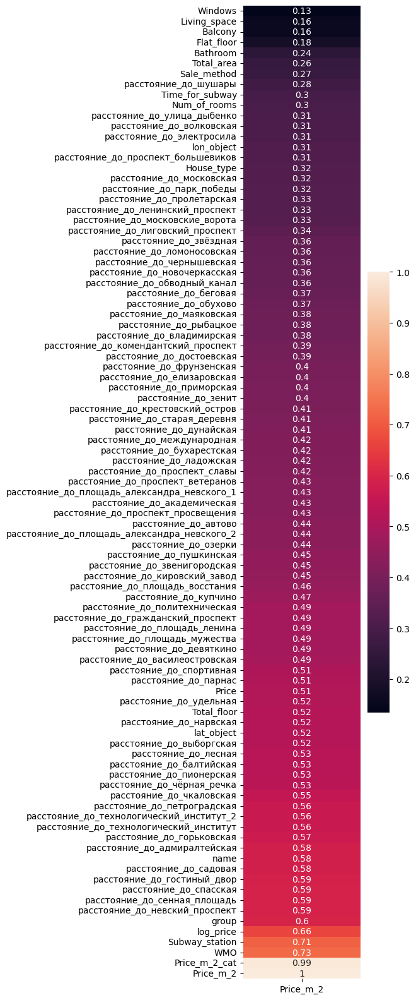

In [13]:
#смотрим на корреляцию то как признаки коррелируют с переменной 'Price_m_2'
y = ['Price_m_2']

plt.figure(figsize=(3, 20))
sns.heatmap(phik_matrix[y].sort_values(by=y), annot=True)
plt.show()

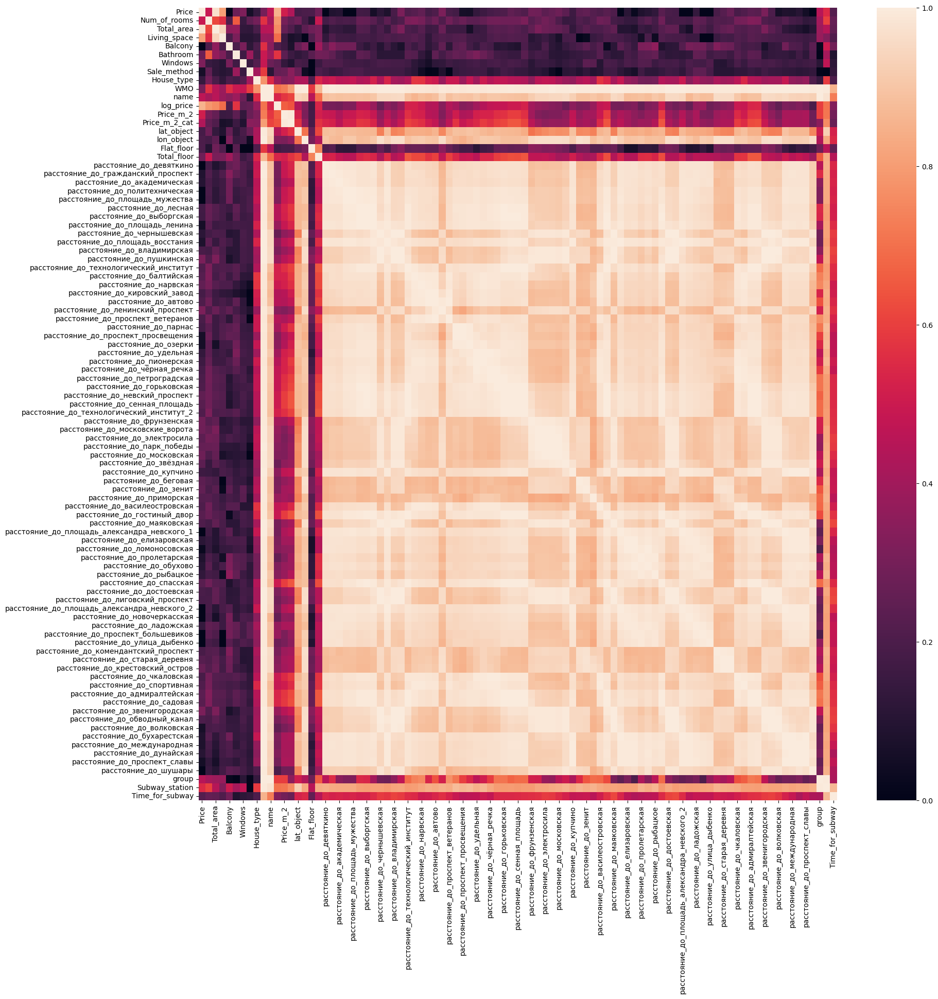

In [14]:
# 
plt.figure(figsize=(20, 20))
sns.heatmap(phik_matrix)
plt.show()

Сильная мультиколлинеарность. Использовать линейные модели нельзя.

### Смотрим на выбросы в числовых фичах

In [15]:
#Для начала сразу же разобьем наши фичи на числовые и категориальные.
num_features = [cname for cname in df.columns if df[cname].dtype in ['int64', 'float64']]
cat_features = [cname for cname in df.columns if df[cname].dtype == "object"]

In [16]:
def outliners_visualization(df, num_features):
    
    """ 
    Визуализация для поиска выбросов в числовых фичах. 
    
    """
    
    for num in num_features:

        fig, ax = plt.subplots(2, figsize=(16, 12))
        fig.suptitle(num)
        
        ax[0].grid(axis='both')
        sns.scatterplot(x=df[num], y=df['Price'], ax=ax[0])
        
        ax[1].grid(axis='both')
        sns.boxplot(x=df[num], ax=ax[1])
        
        plt.show()

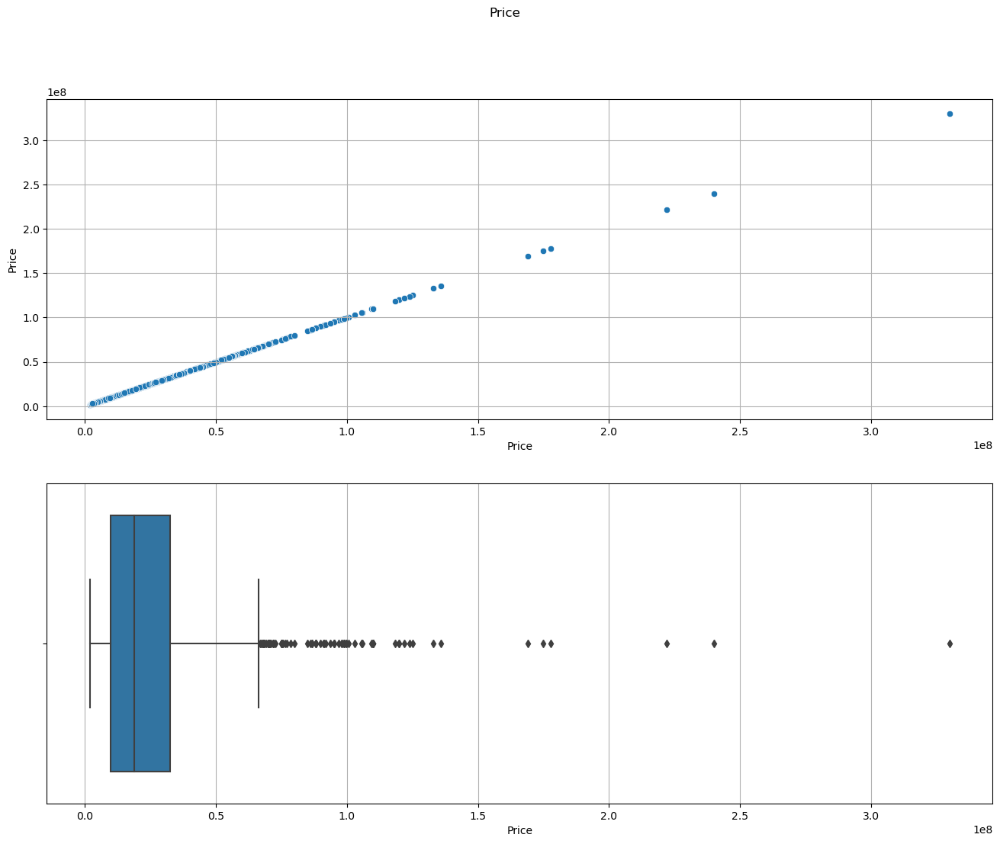

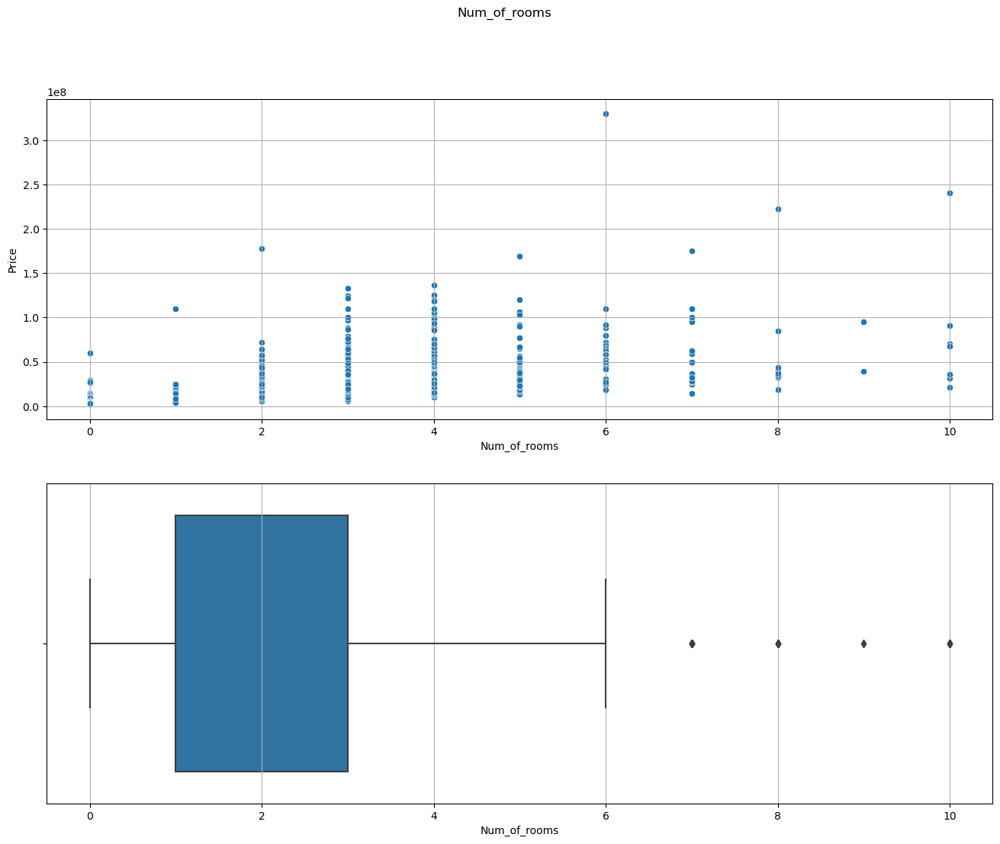

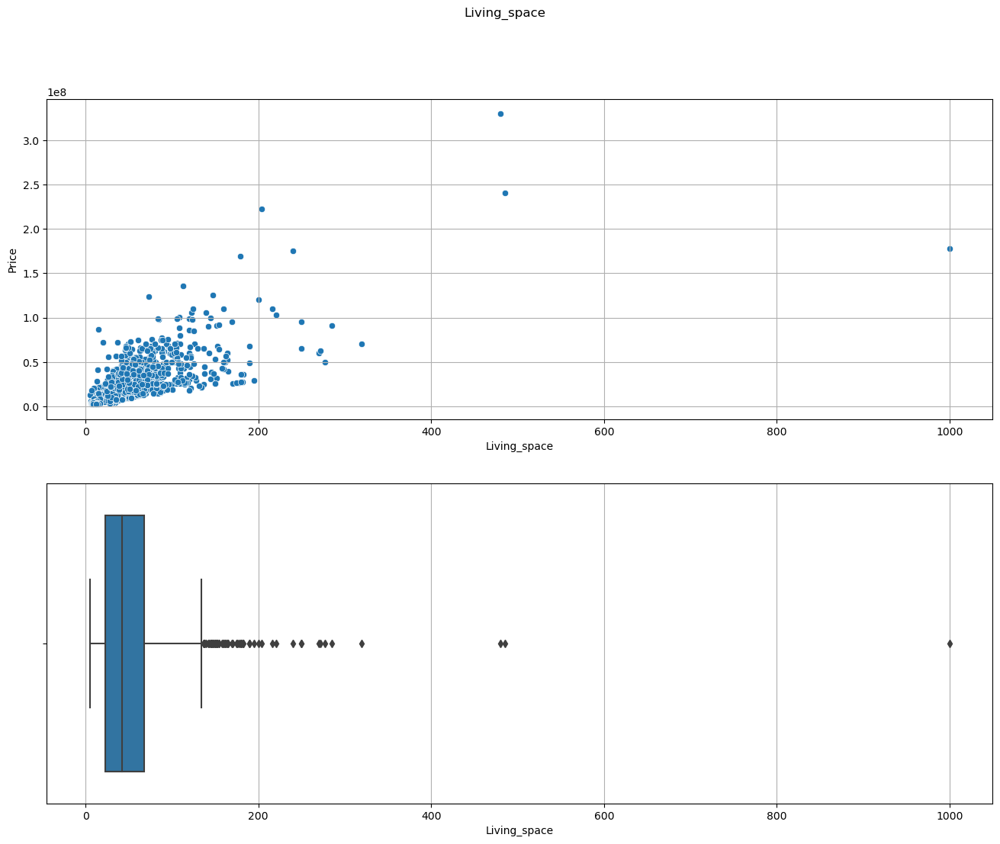

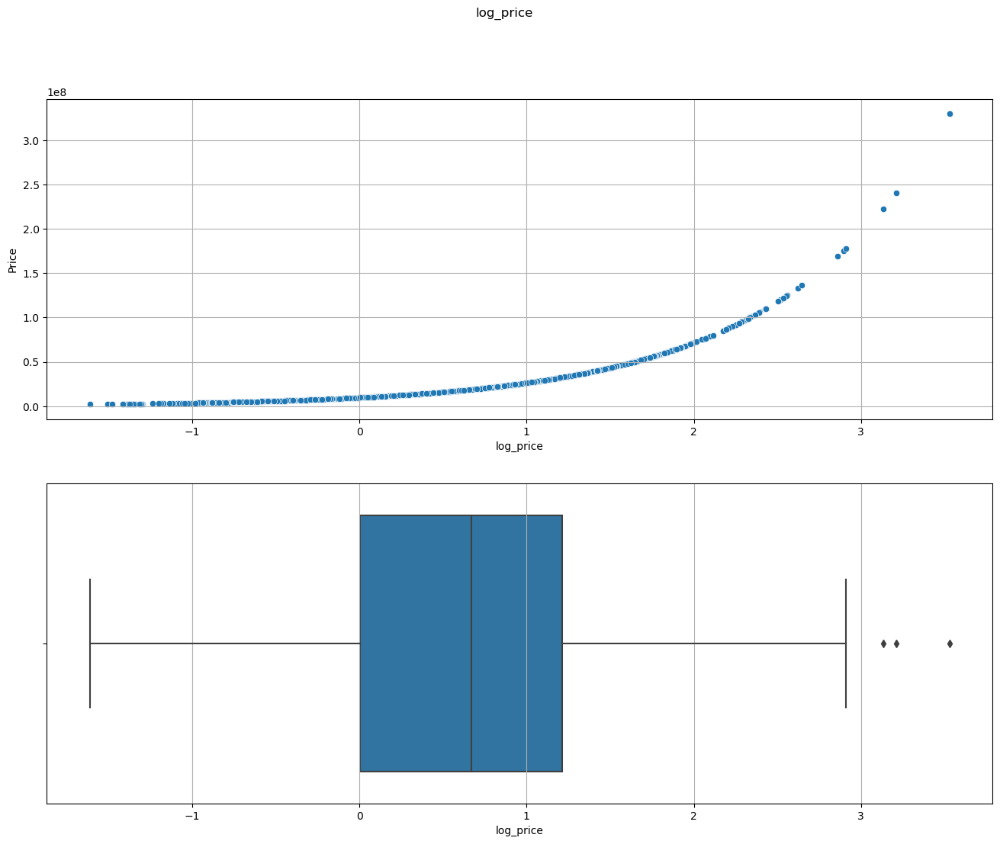

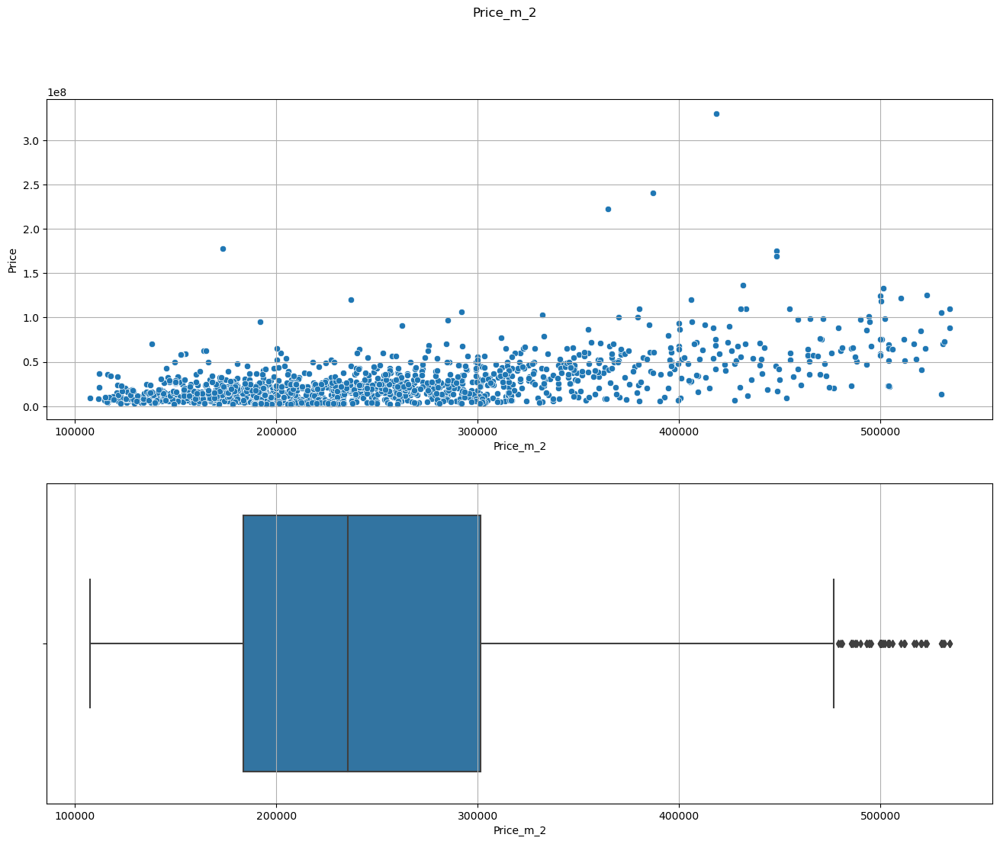

...

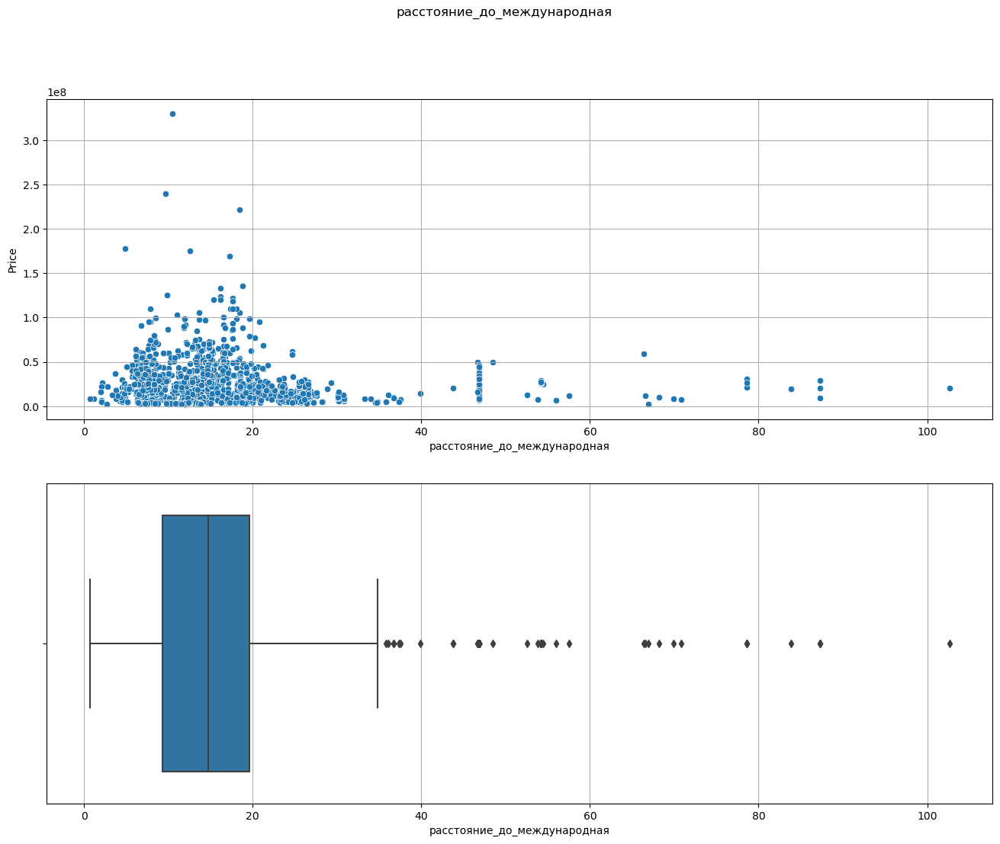

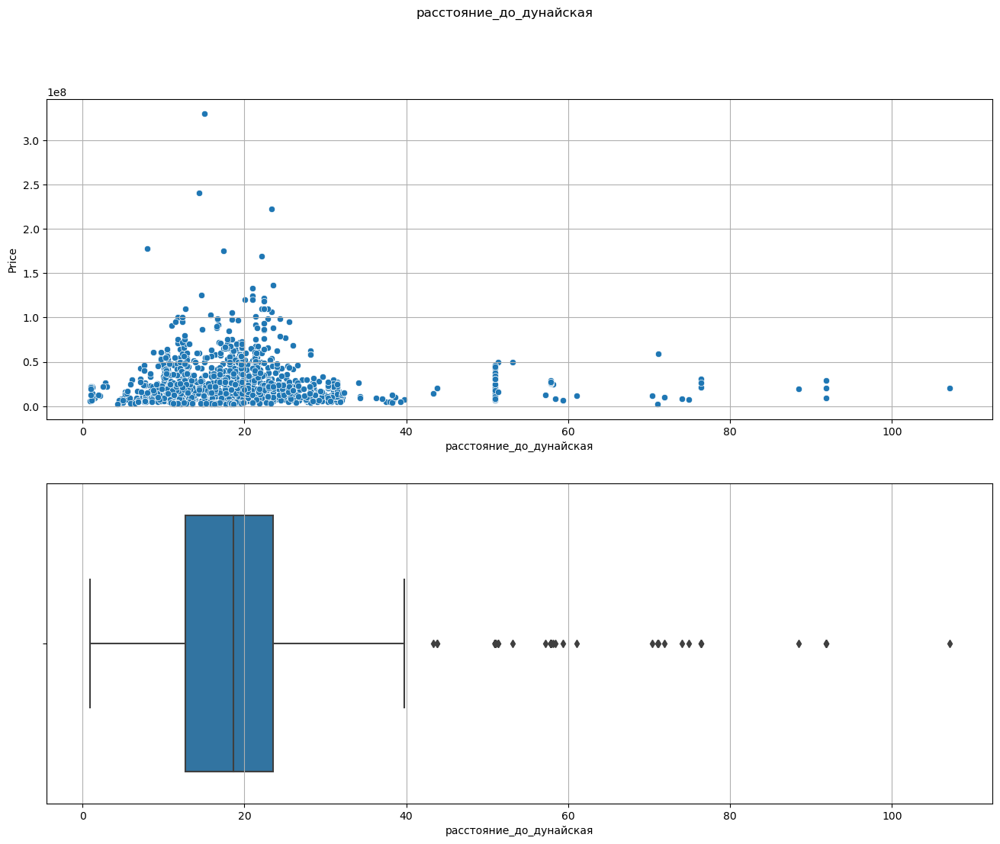

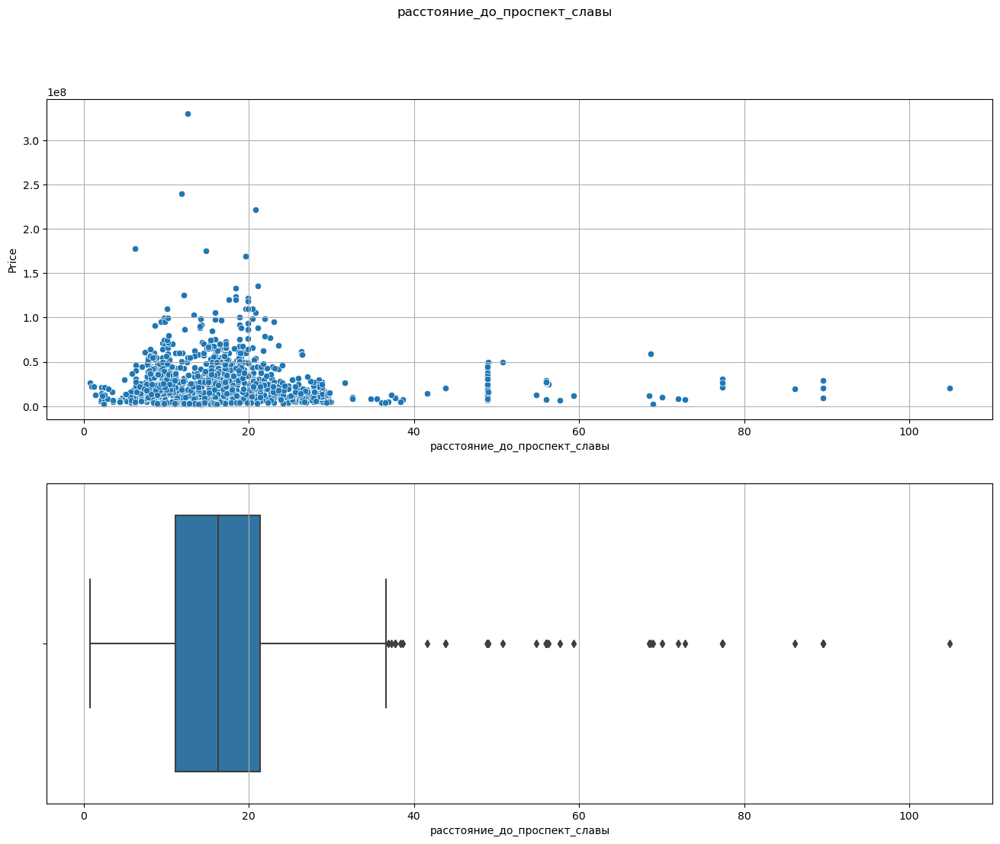

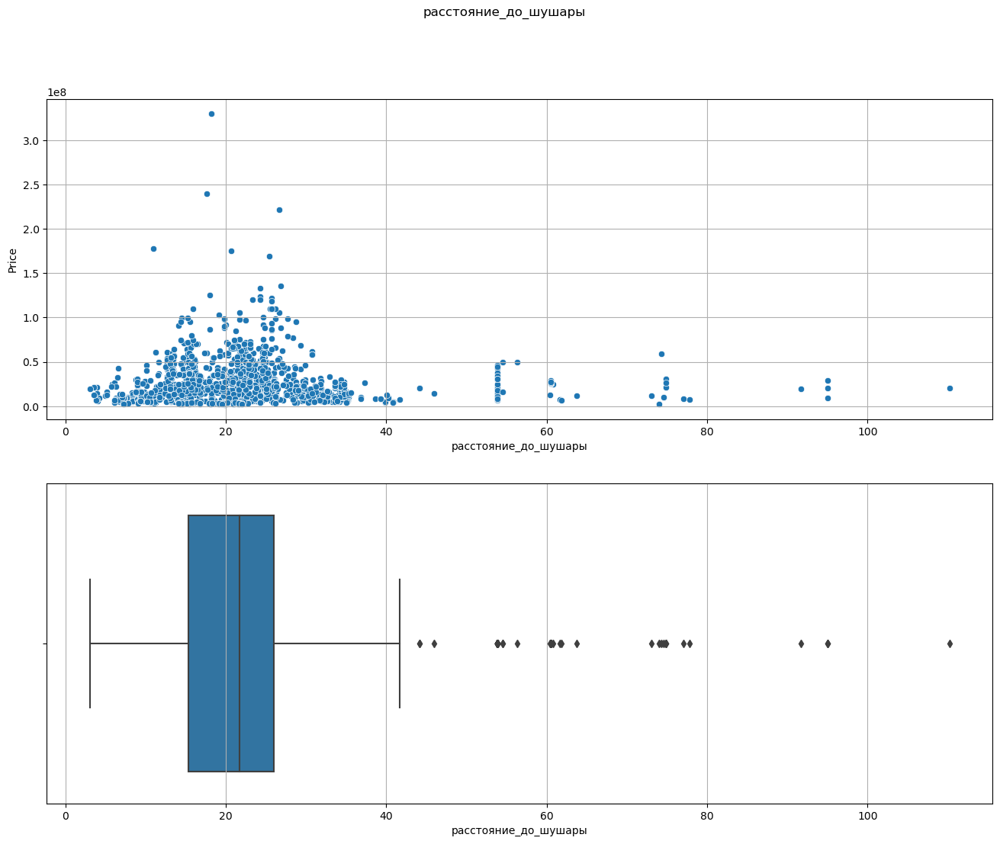

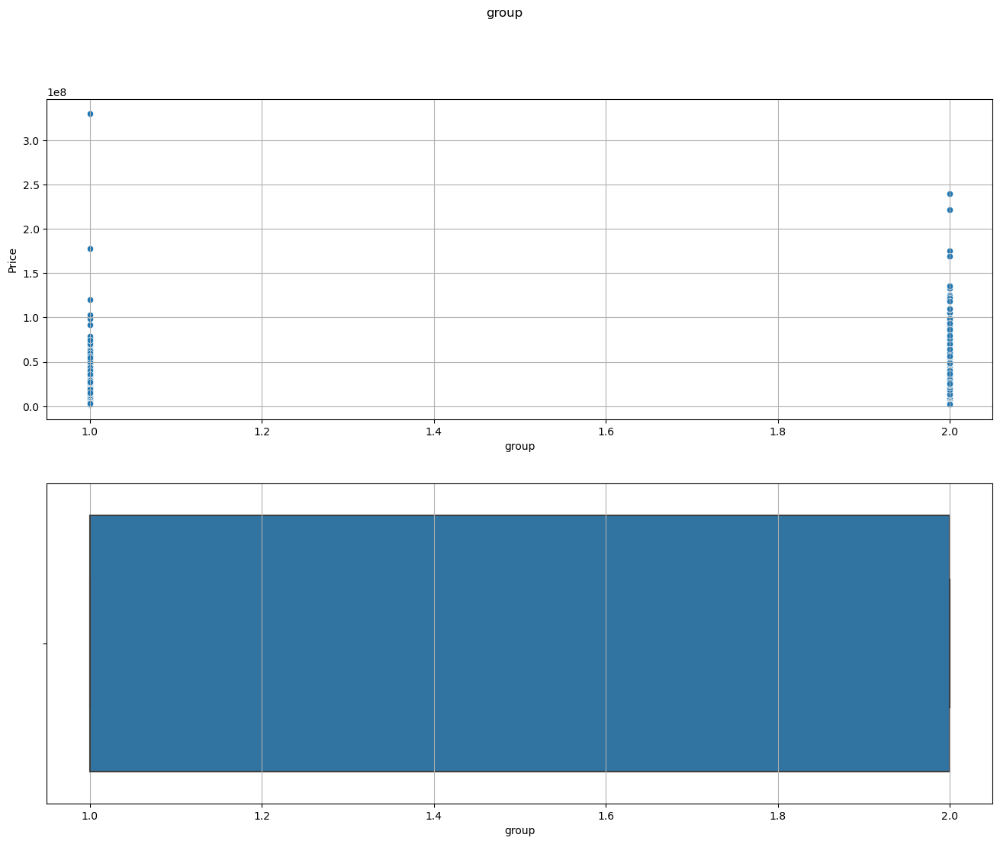

In [17]:
outliners_visualization(df, num_features)

Стоит обратить внимание на следующие фичи:
    
- Количество комнат
- жилая площадь. Думаю ее нужно будет ограничить до 50 кв.м.
- также стоит обратить внимание и на выбросы в нашей переменной цена за квадратный метр. Думается, чтобы давать предсказание релевантной цены, нужно будет ограничить переменную до 320 тыс. 

In [18]:
def num_visualization(df, num_features):
    
    """ Строит distplot (seaborn) для всех числовых признаков. """
    
    for num in num_features:
        
        fig = plt.figure(figsize=(12, 5))
        fig.suptitle(num)
        
        plt.grid(axis='both')
        plt.axvline(x = df[num].mean(), c = 'red') # среднее значение
        plt.axvline(x = df[num].median(), c = 'green') # медиана
        sns.distplot(df[num], fit=norm)
    
        dark_line = mlines.Line2D([], [], color='black', label='norm. dist.')
        grean_line = mlines.Line2D([], [], color='green', label='median')
        red_line = mlines.Line2D([], [], color='red', label='mean')
        plt.legend(handles=[dark_line, grean_line, red_line])
        
        plt.show()
        
        print(f'Ассиметрия: {df[num].kurtosis()}')
        print(f'Аксцесс: {df[num].skew()}')

E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


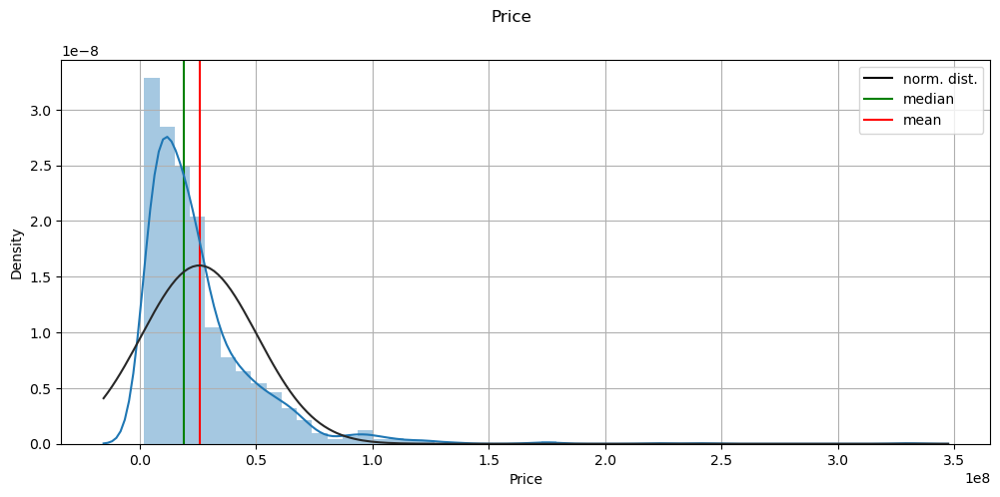

Ассиметрия: 24.973128153371288
Аксцесс: 3.524548806257183


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


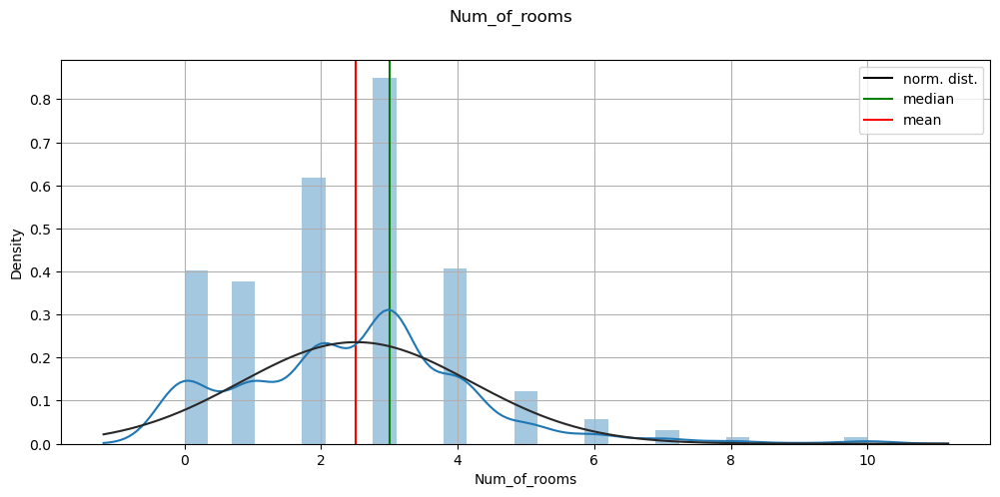

Ассиметрия: 1.9634885731074863
Аксцесс: 0.8011765976452446


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


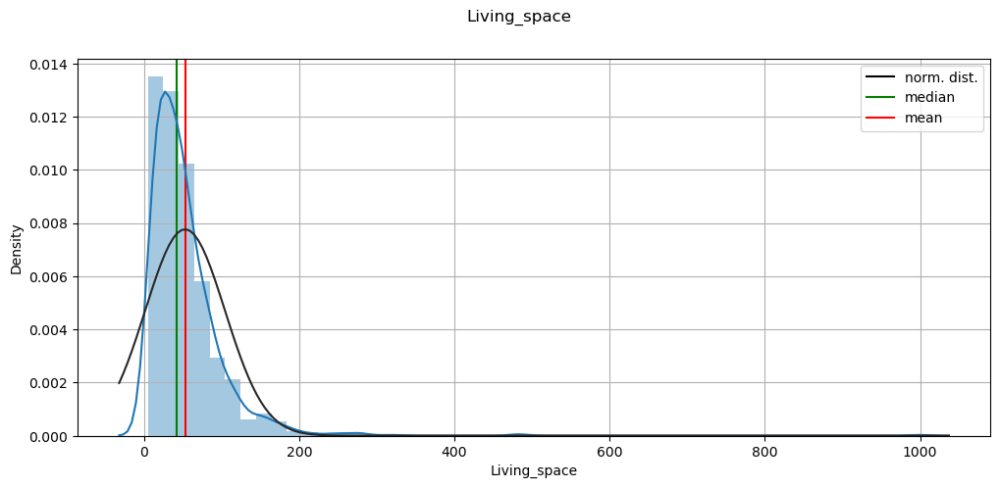

Ассиметрия: 100.76959962423153
Аксцесс: 6.869863889503754


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


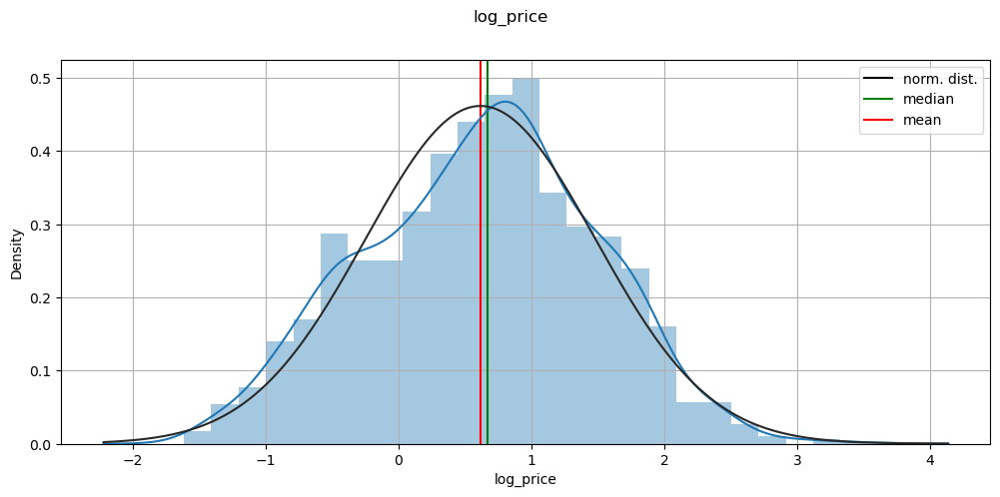

Ассиметрия: -0.4072098730299545
Аксцесс: -0.06288820906366965


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


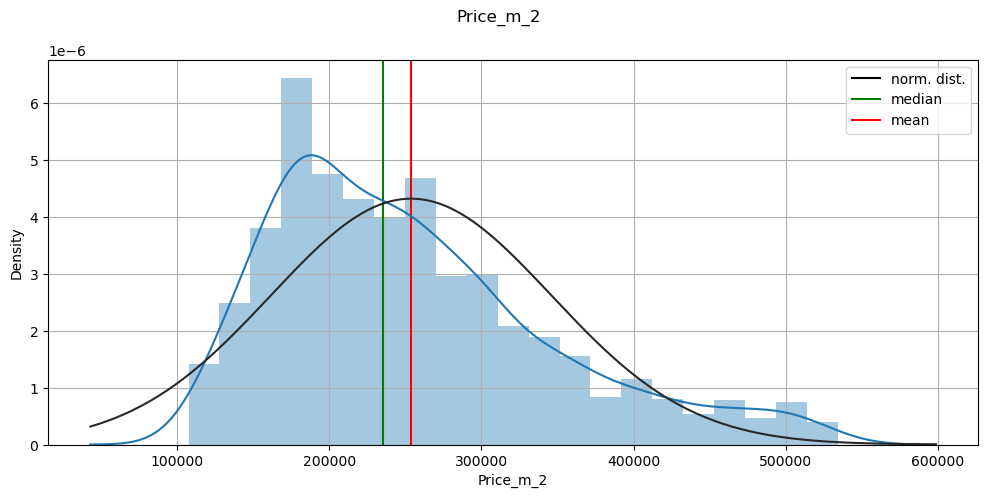

Ассиметрия: 0.35741172073502403
Аксцесс: 0.9205584520064055


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


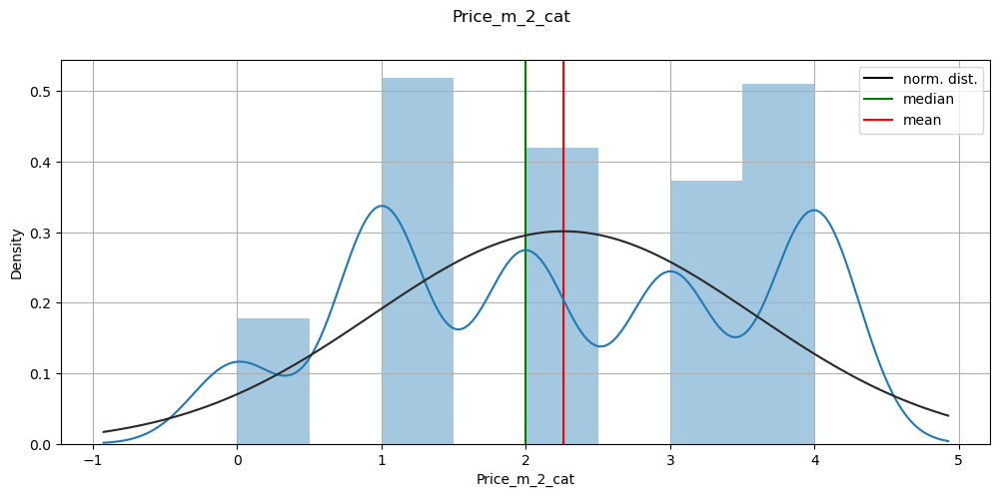

E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Ассиметрия: -1.2565894297943339
Аксцесс: -0.05529195709258929


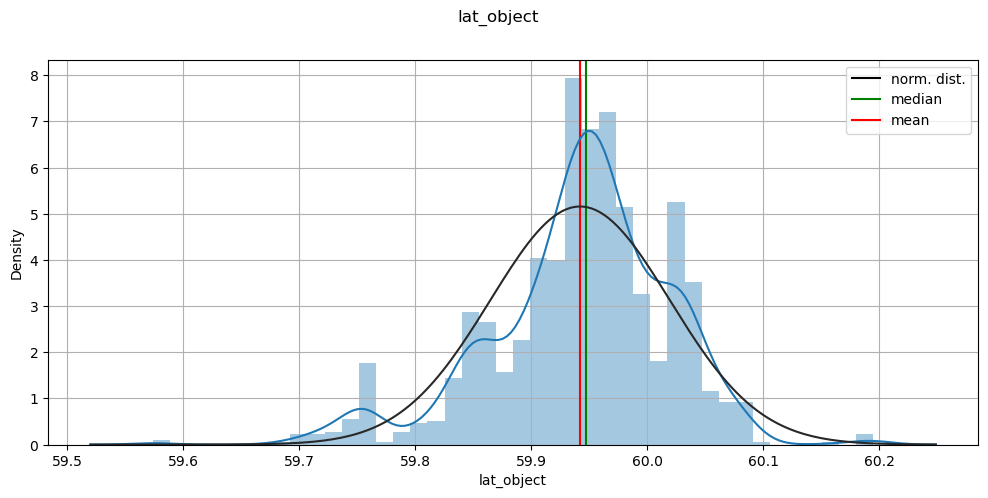

Ассиметрия: 1.2782799923860817
Аксцесс: -0.675120657338221


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


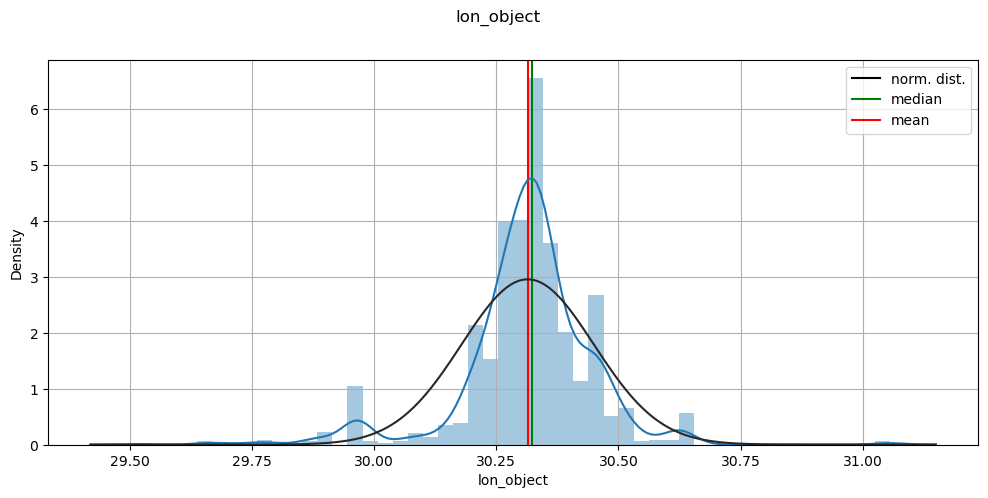

Ассиметрия: 5.506043657893924
Аксцесс: -0.8334588063165311


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


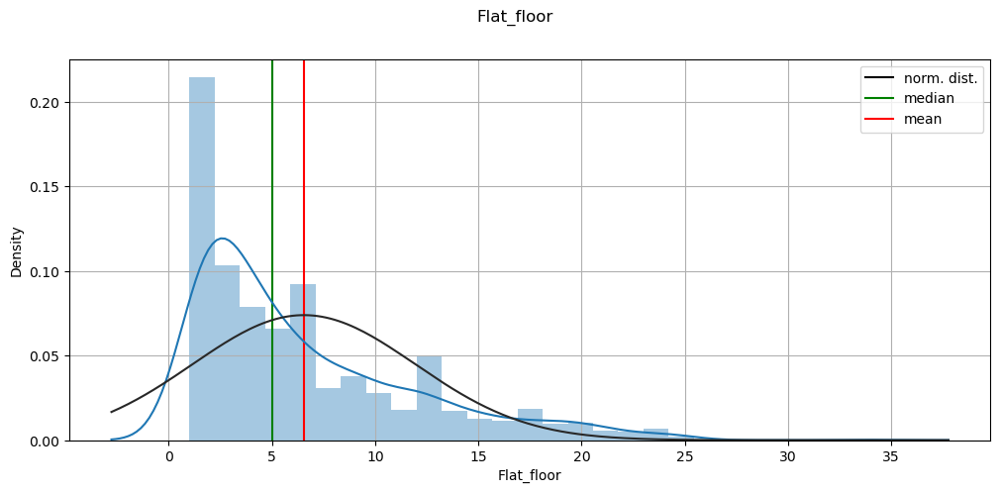

Ассиметрия: 1.2701161089994764
Аксцесс: 1.3053374560930233


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


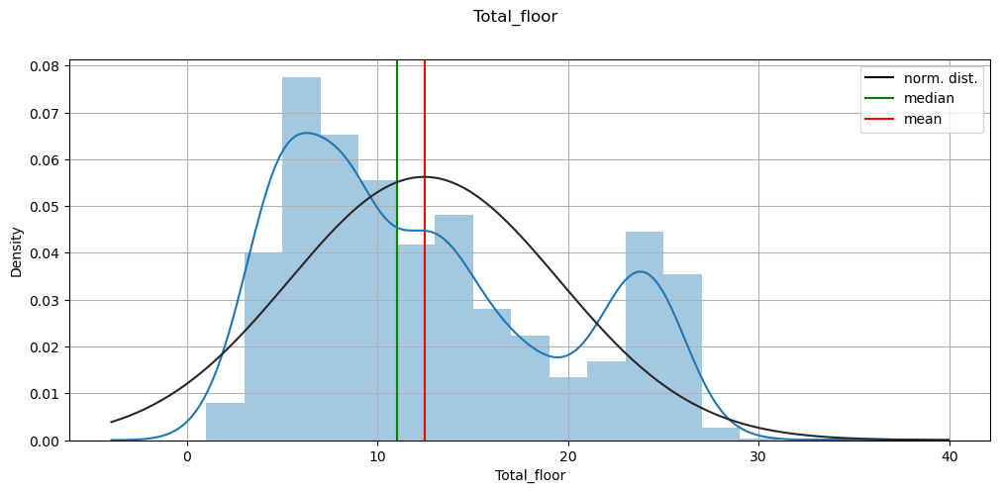

Ассиметрия: -0.9232625358368969
Аксцесс: 0.5457739124711583


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


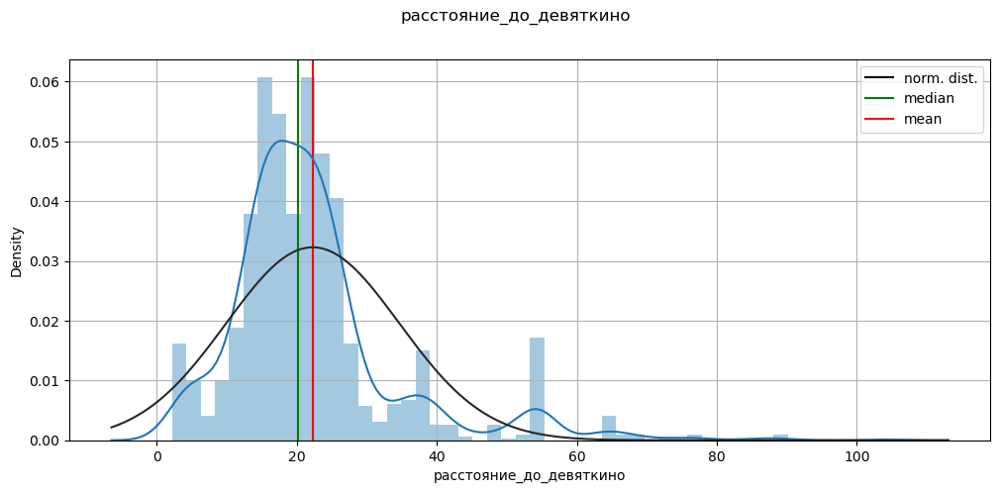

Ассиметрия: 5.782793347510147
Аксцесс: 1.9703466717278835


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


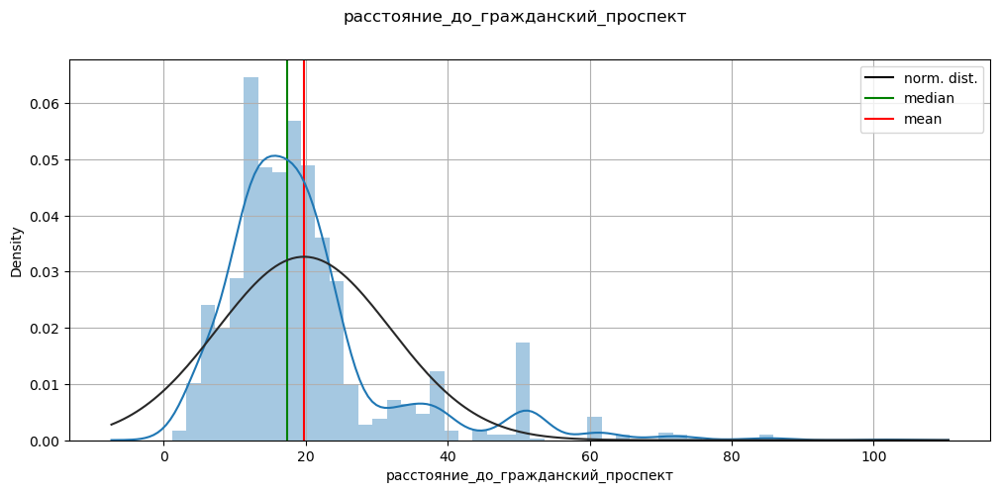

Ассиметрия: 6.136726103069204
Аксцесс: 2.1156869408729104


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


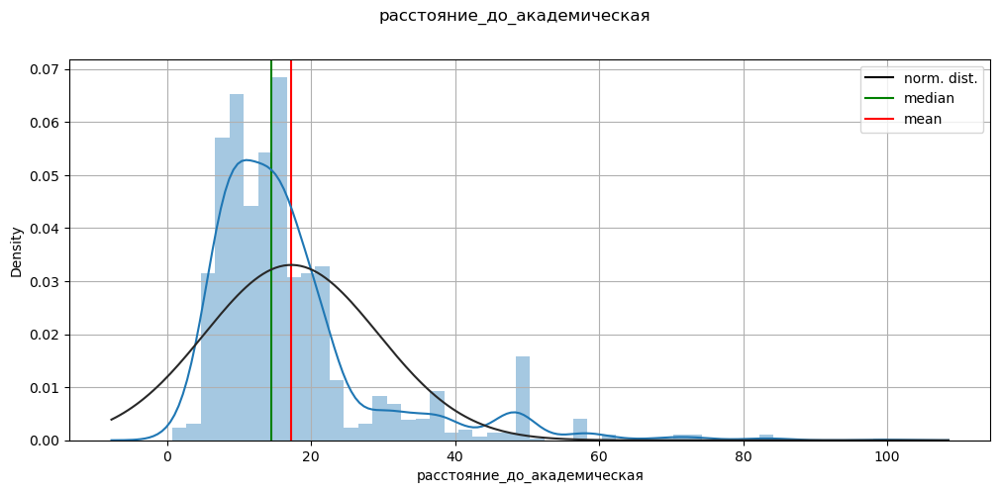

Ассиметрия: 6.7971351434099905
Аксцесс: 2.2904796546339563


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


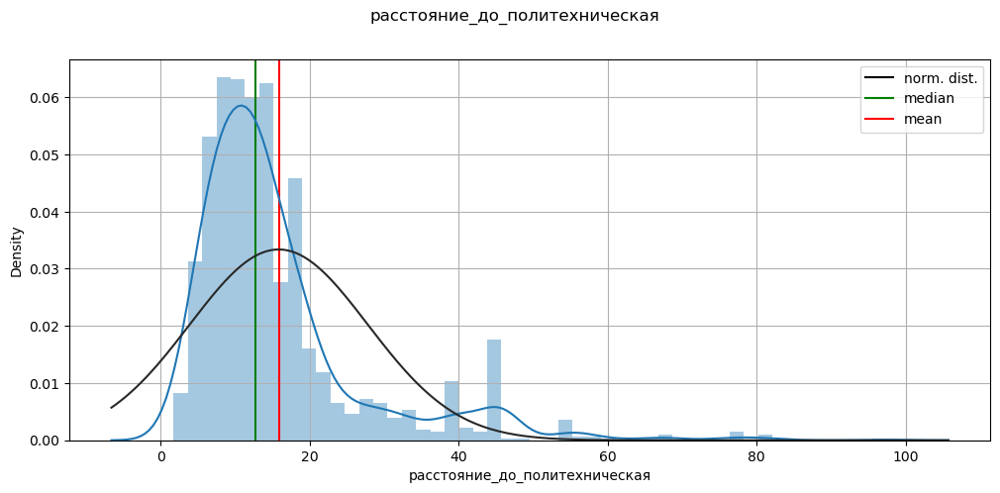

Ассиметрия: 6.791758984087446
Аксцесс: 2.305102331995199


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


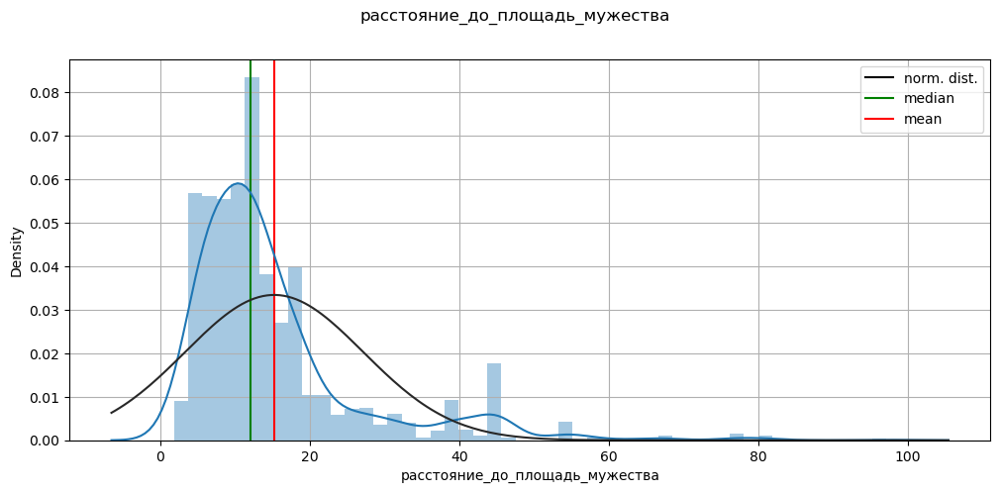

Ассиметрия: 7.038908889544448
Аксцесс: 2.344845056497381


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


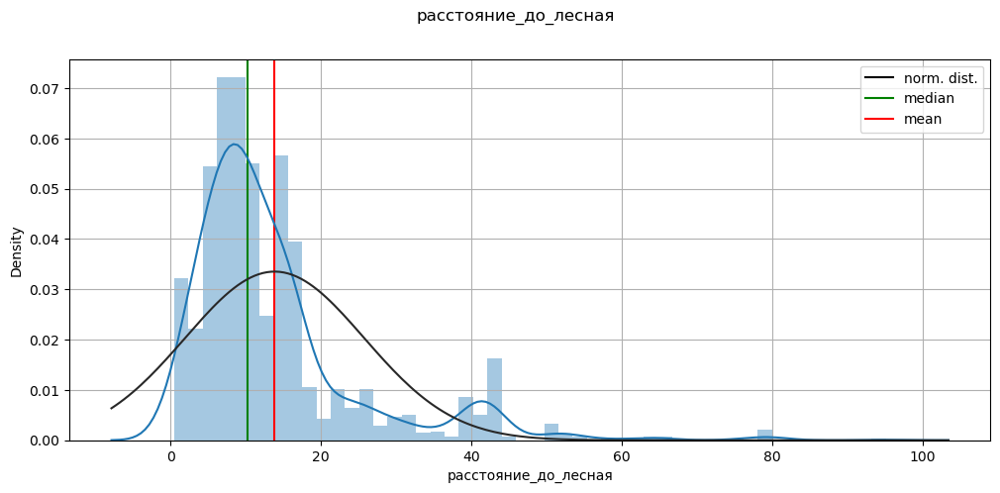

Ассиметрия: 7.093155549114504
Аксцесс: 2.317734039701335


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


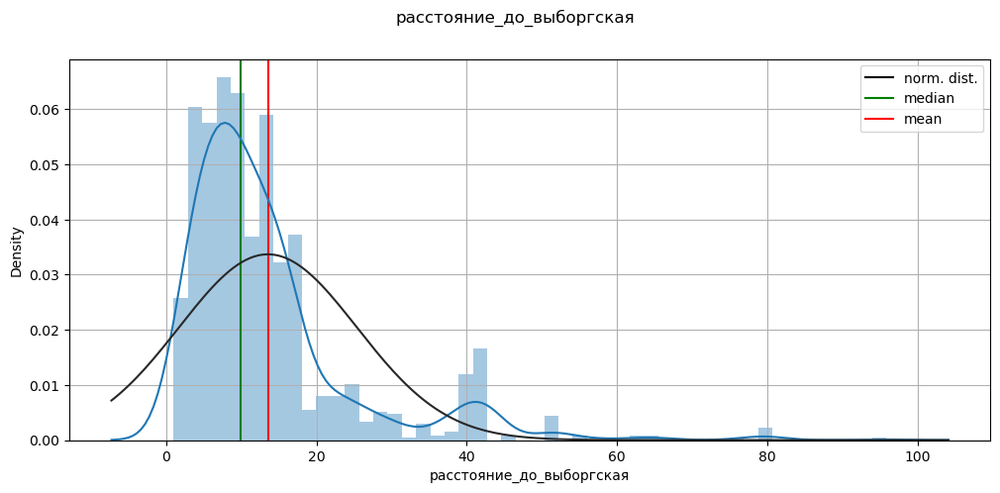

Ассиметрия: 7.629787445859099
Аксцесс: 2.3974672363250775


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


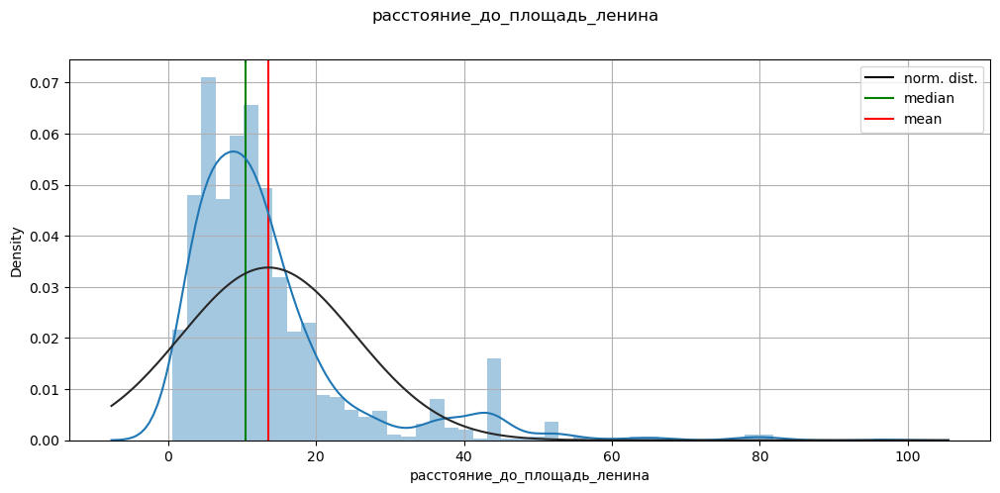

Ассиметрия: 8.20582673961483
Аксцесс: 2.472201811529782


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


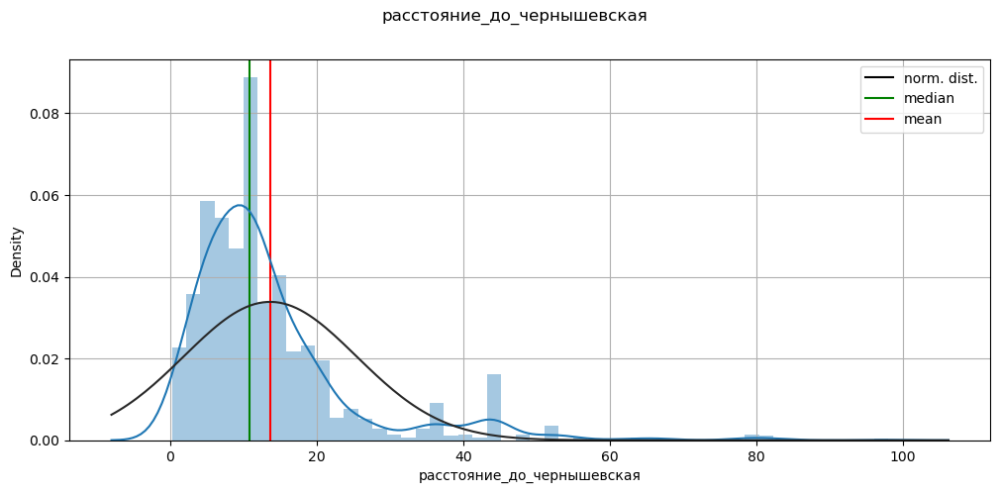

Ассиметрия: 8.481303342976524
Аксцесс: 2.4895483179751077


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


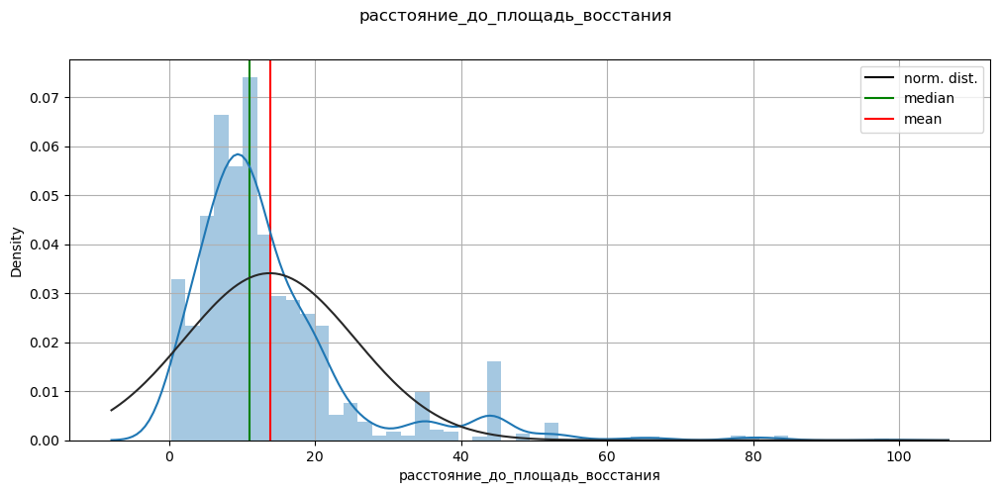

Ассиметрия: 8.815802777763782
Аксцесс: 2.505014648618449


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


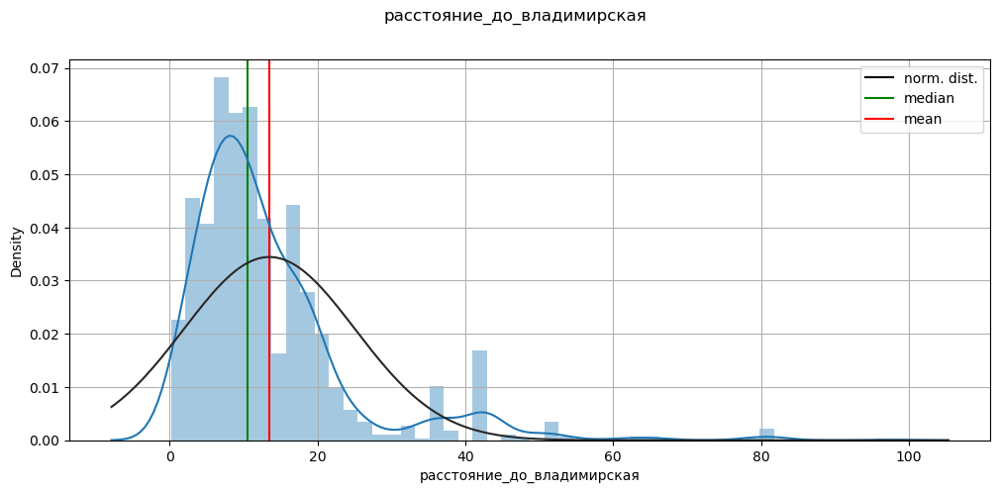

Ассиметрия: 8.869391226111567
Аксцесс: 2.4966361495316476


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


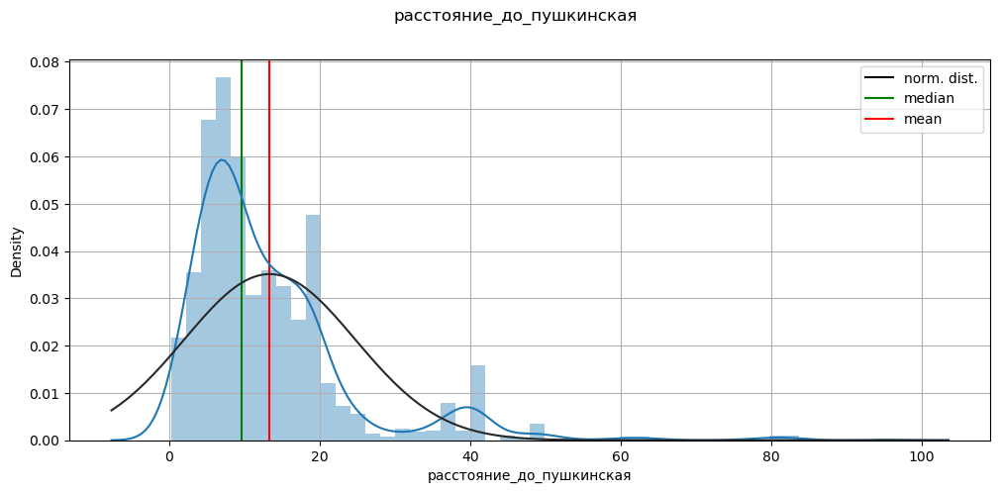

Ассиметрия: 9.008634712373654
Аксцесс: 2.4764797882783096


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


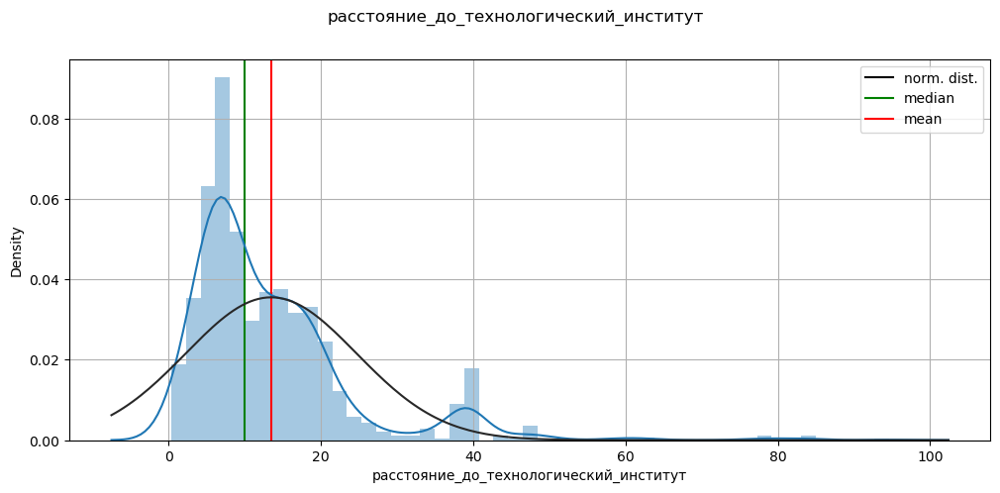

Ассиметрия: 9.017608498600843
Аксцесс: 2.4401102873037033


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


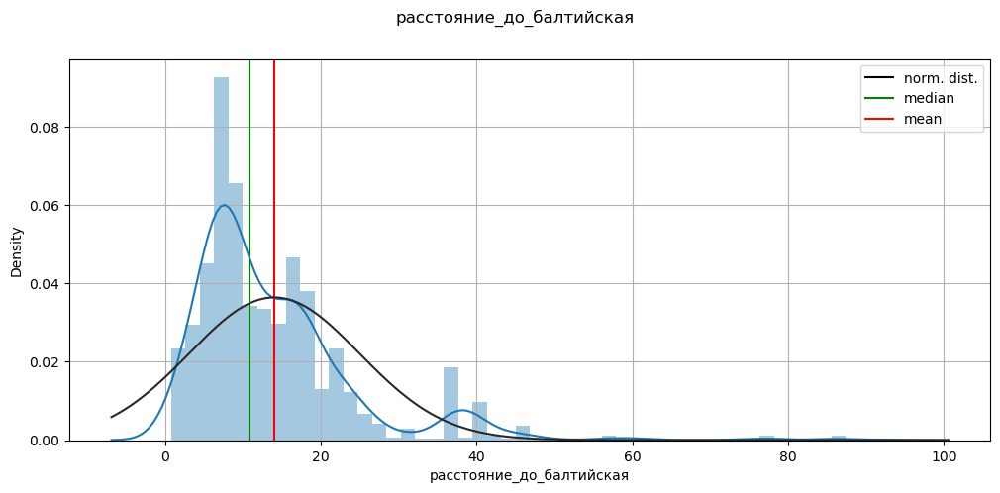

Ассиметрия: 9.184902413082753
Аксцесс: 2.3850422929645565


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


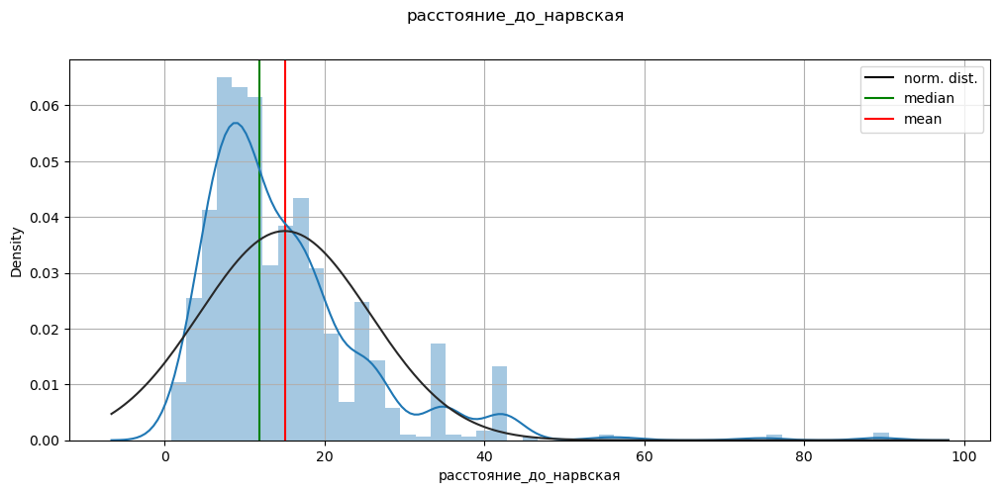

Ассиметрия: 9.272189138659822
Аксцесс: 2.3035399819248292


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


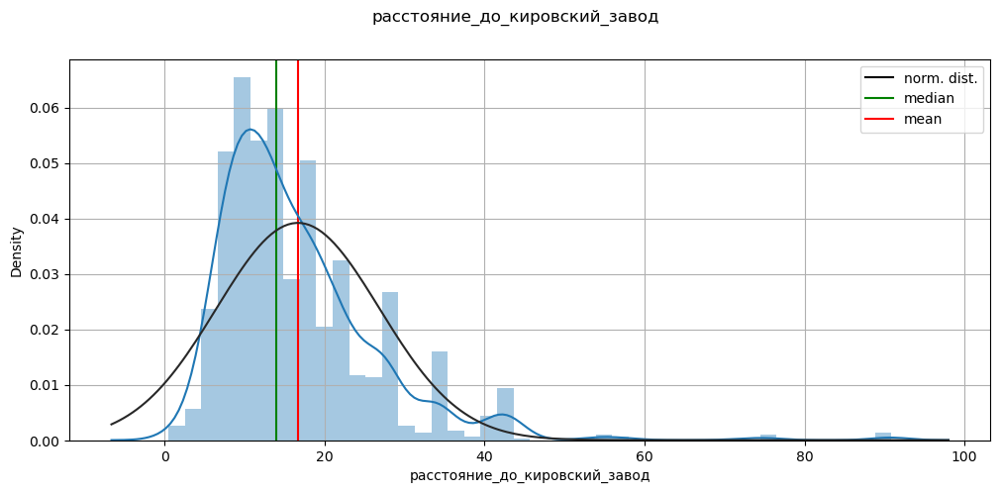

Ассиметрия: 10.28839702466401
Аксцесс: 2.331370149239504


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


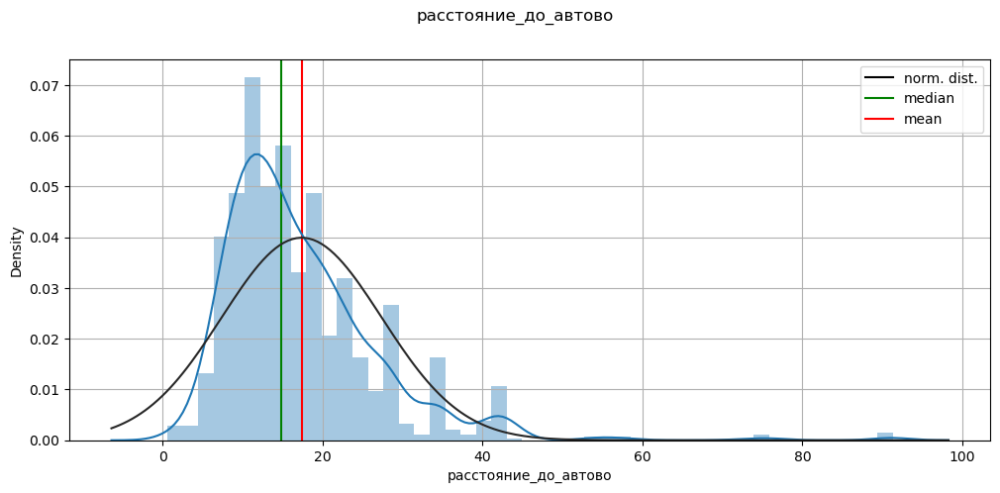

Ассиметрия: 10.834006312949805
Аксцесс: 2.3549730423887656


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


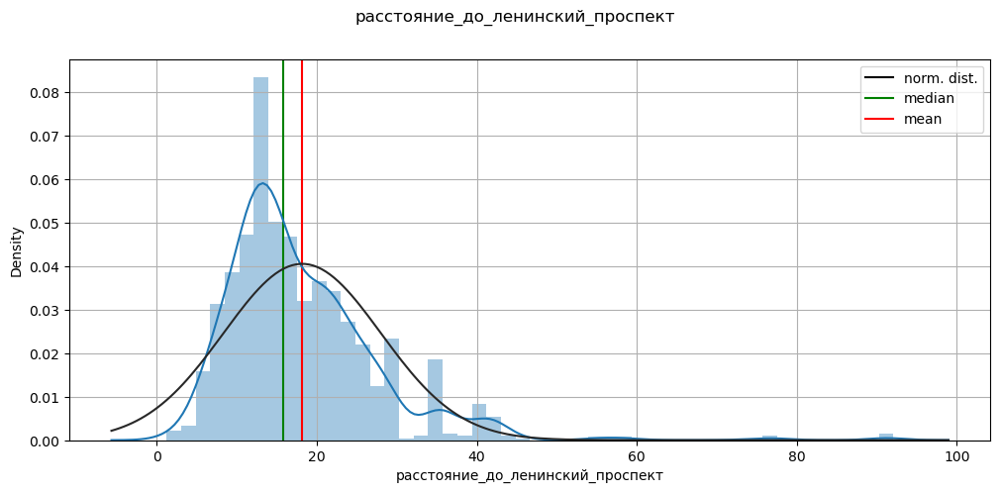

Ассиметрия: 11.452558659839678
Аксцесс: 2.390685423795253


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


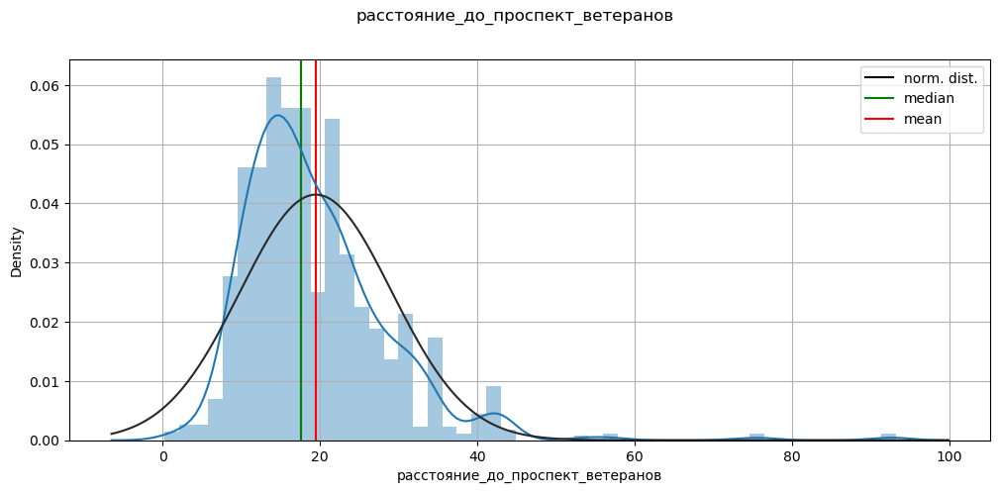

Ассиметрия: 11.699199743827858
Аксцесс: 2.3214226866543752


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


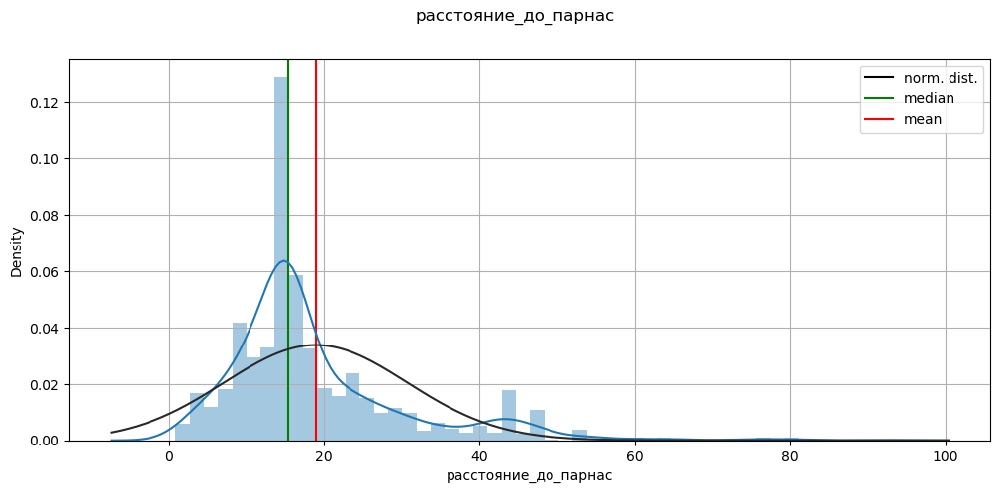

Ассиметрия: 4.504290937760427
Аксцесс: 1.819982422904258


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


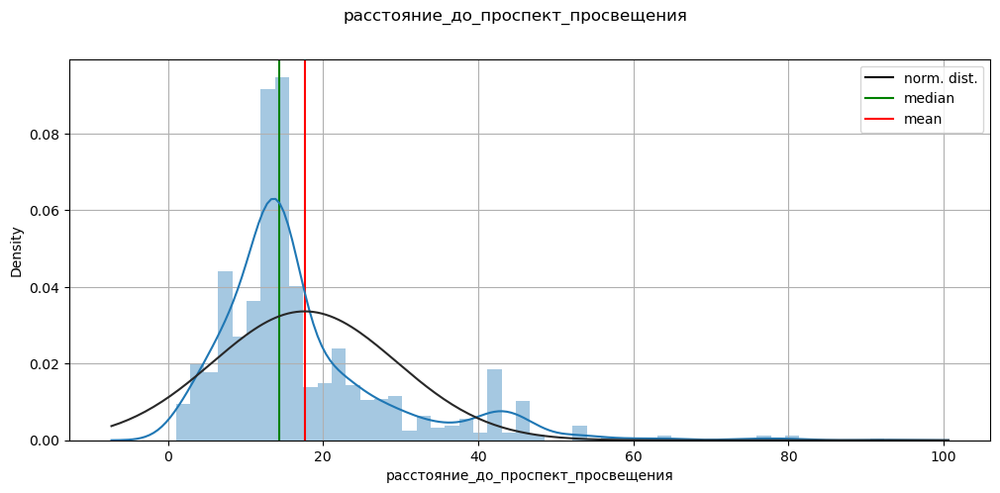

Ассиметрия: 4.864176425806031
Аксцесс: 1.9015481773674825


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


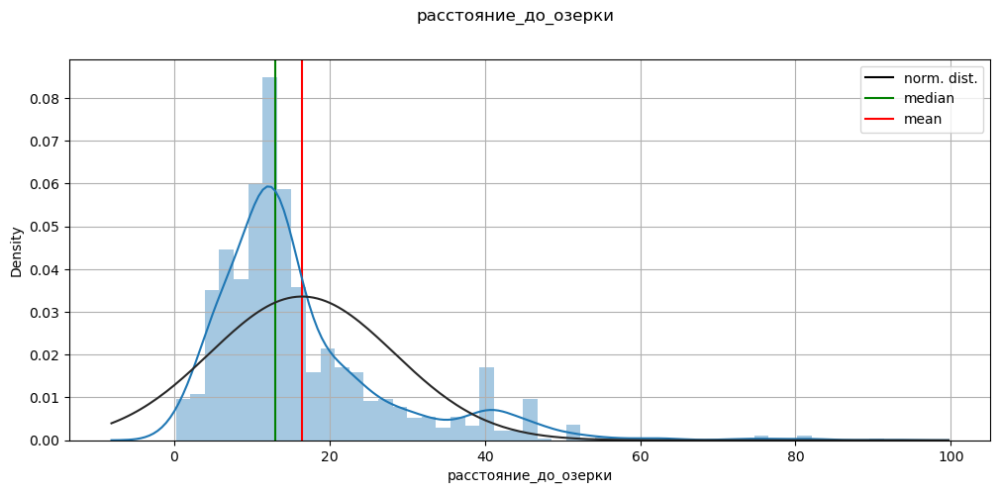

Ассиметрия: 5.092474281047398
Аксцесс: 1.9448007485411947


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


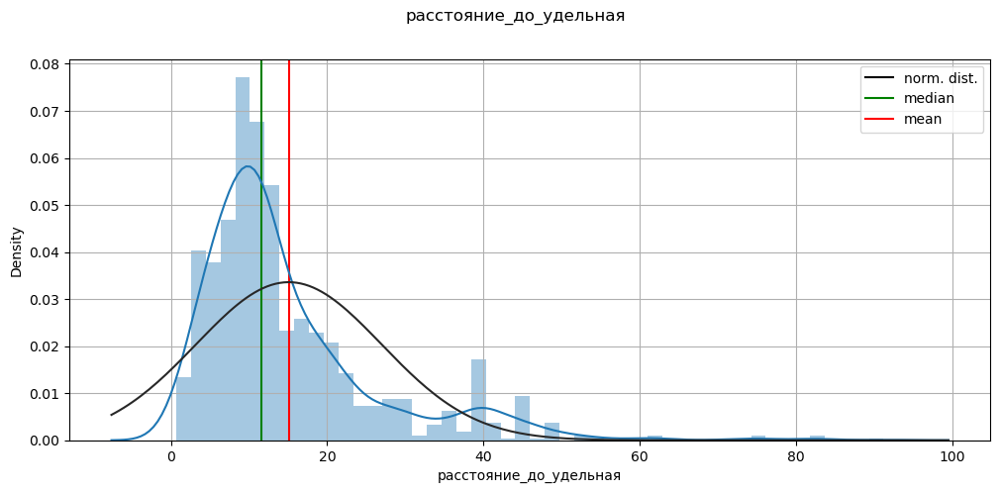

Ассиметрия: 5.606907580163011
Аксцесс: 2.042893540622601


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


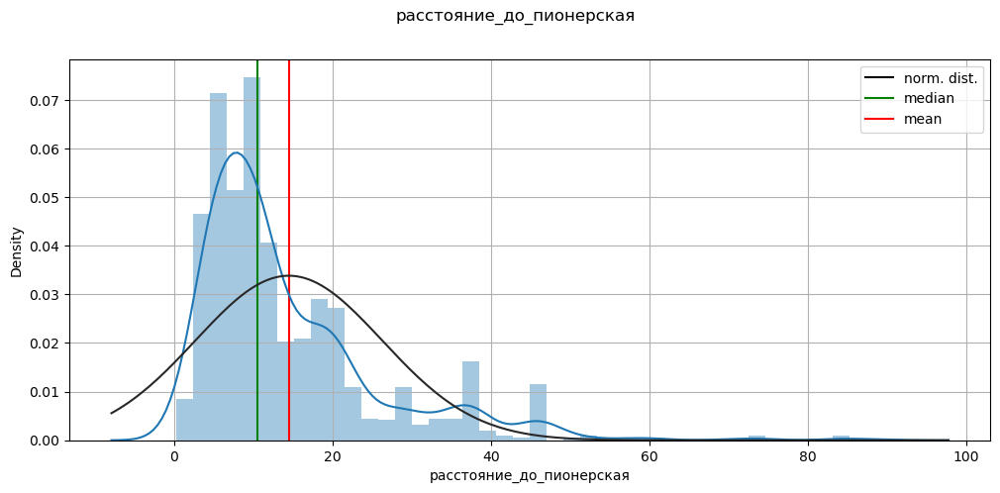

Ассиметрия: 5.7545833392057
Аксцесс: 2.0383910660466498


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


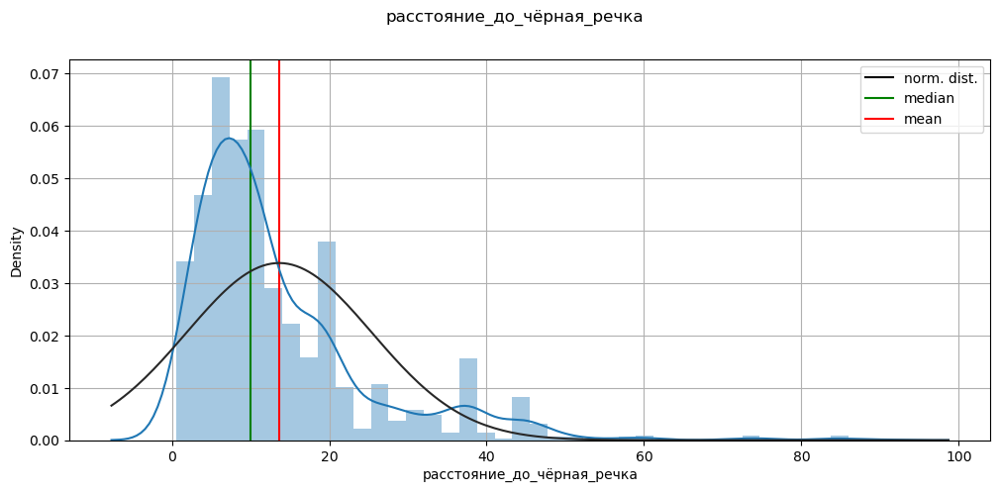

Ассиметрия: 6.2725385247647765
Аксцесс: 2.1165579284549163


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


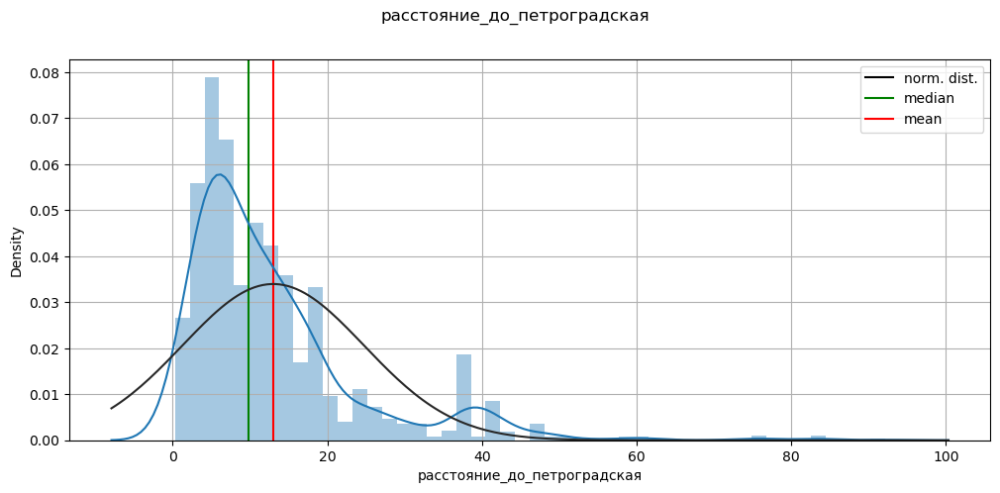

Ассиметрия: 7.035199300192984
Аксцесс: 2.2350524915673753


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


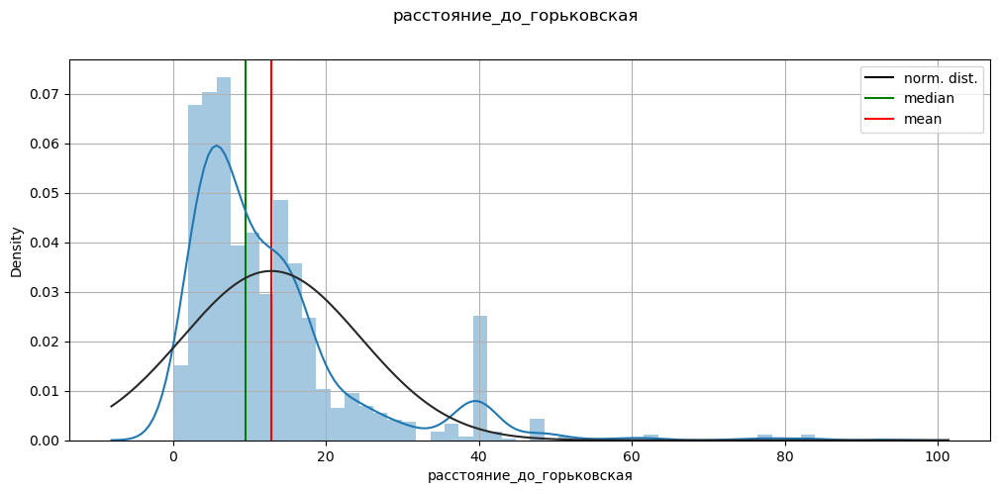

Ассиметрия: 7.599923225853919
Аксцесс: 2.32870424391899


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


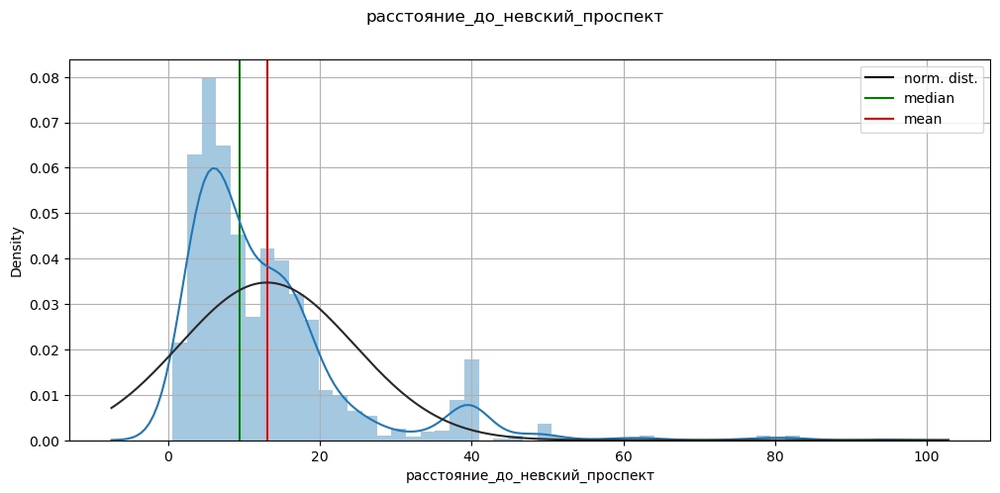

Ассиметрия: 8.497880954324037
Аксцесс: 2.4390568087492714


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


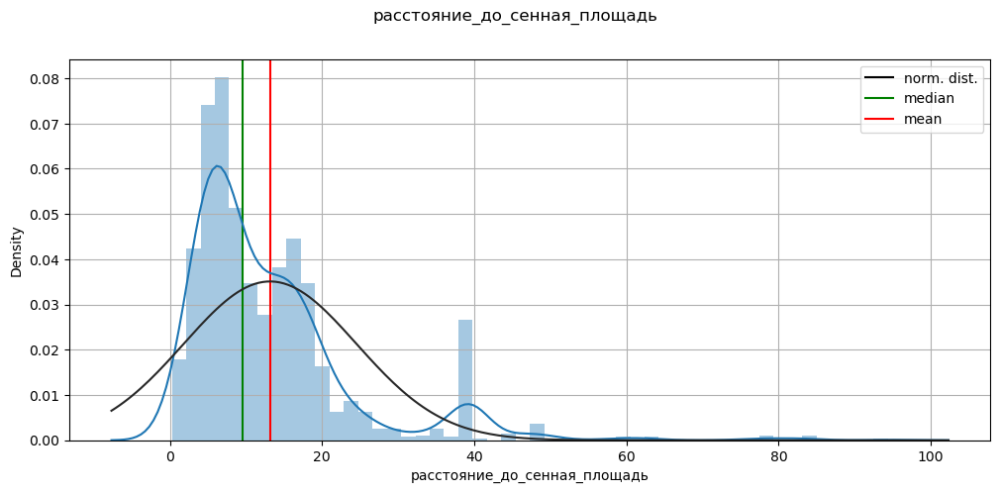

Ассиметрия: 8.68034072763055
Аксцесс: 2.429125902657538


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


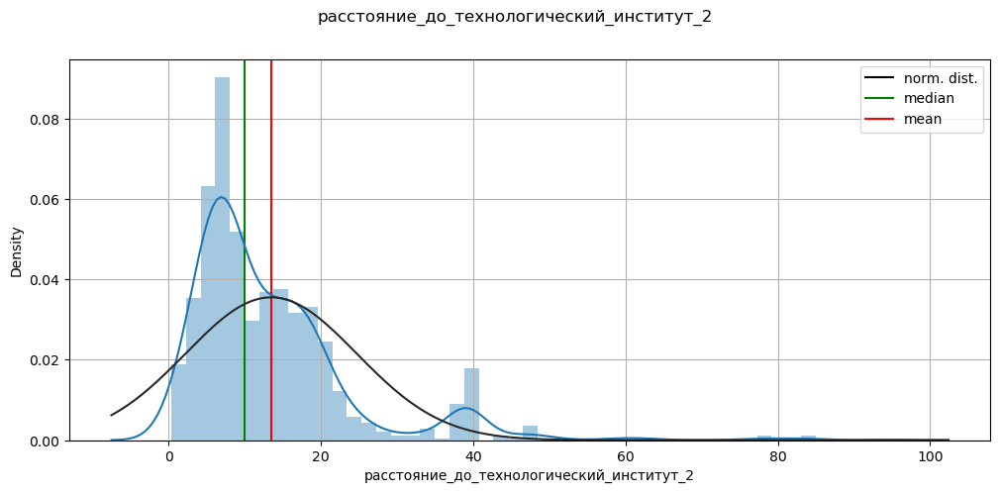

Ассиметрия: 9.017608498600843
Аксцесс: 2.4401102873037033


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


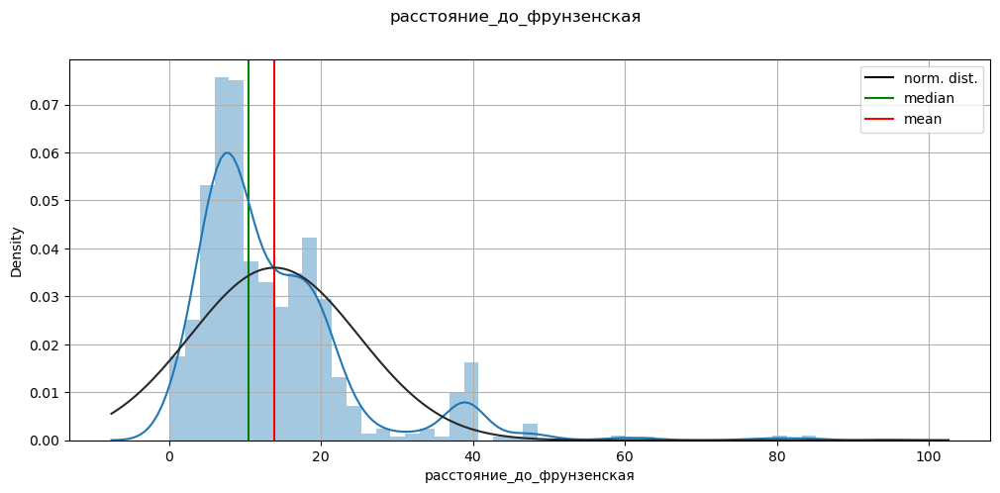

Ассиметрия: 9.360119496598097
Аксцесс: 2.451502765931256


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


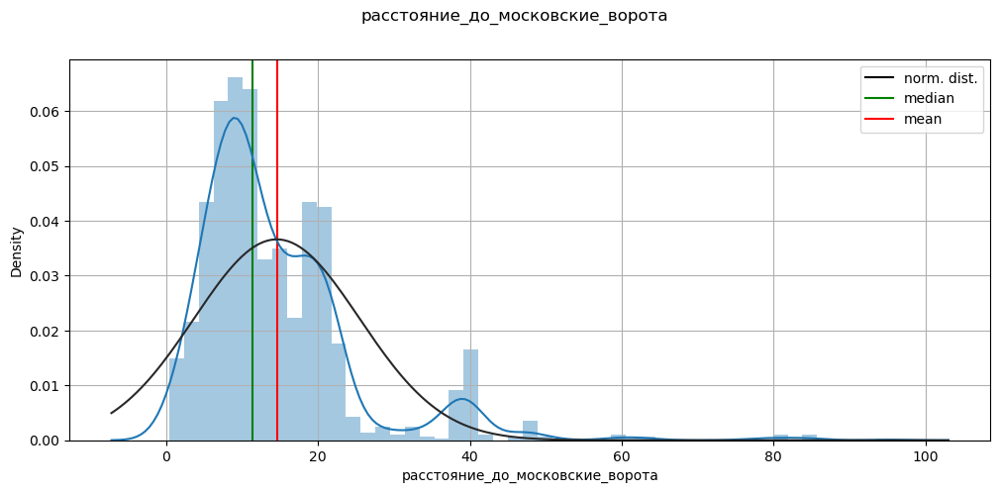

Ассиметрия: 9.884703160387275
Аксцесс: 2.477173612696717


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


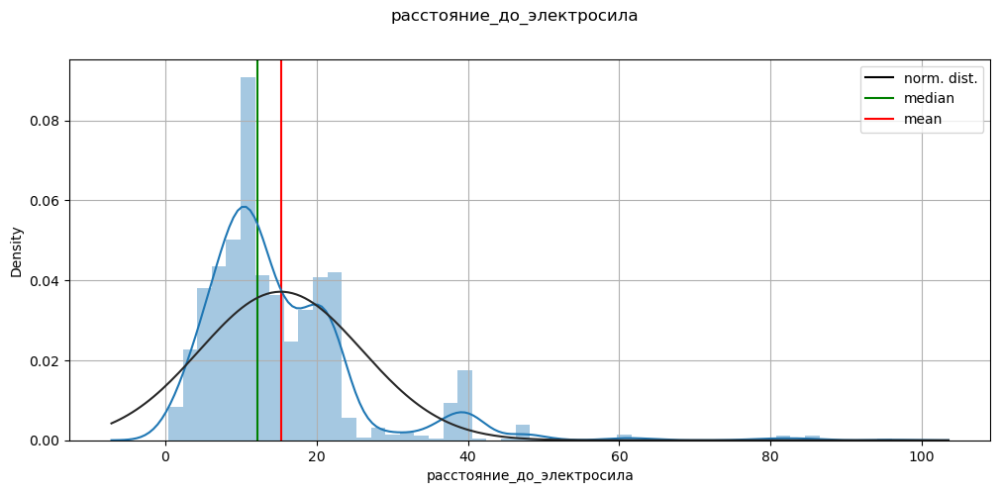

Ассиметрия: 10.268527029971986
Аксцесс: 2.4830900302459074


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


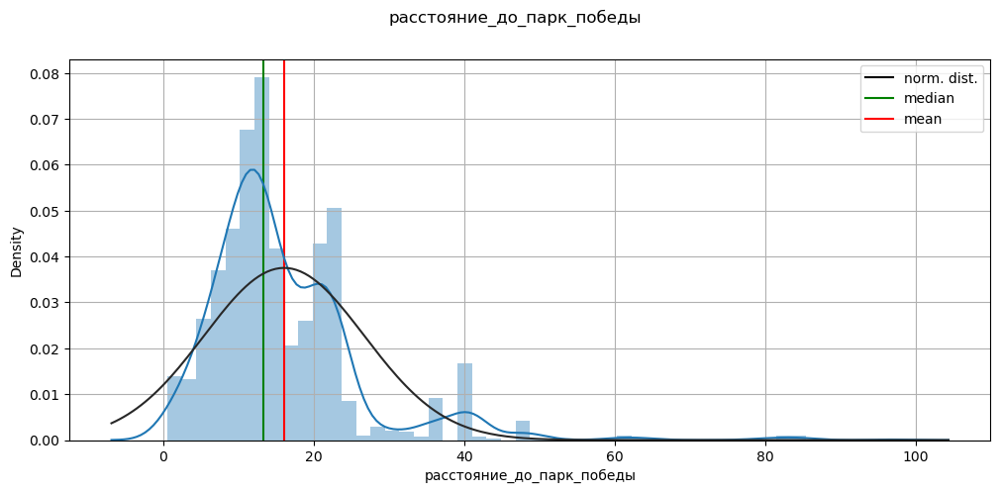

Ассиметрия: 10.525900265828614
Аксцесс: 2.4668568104769677


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


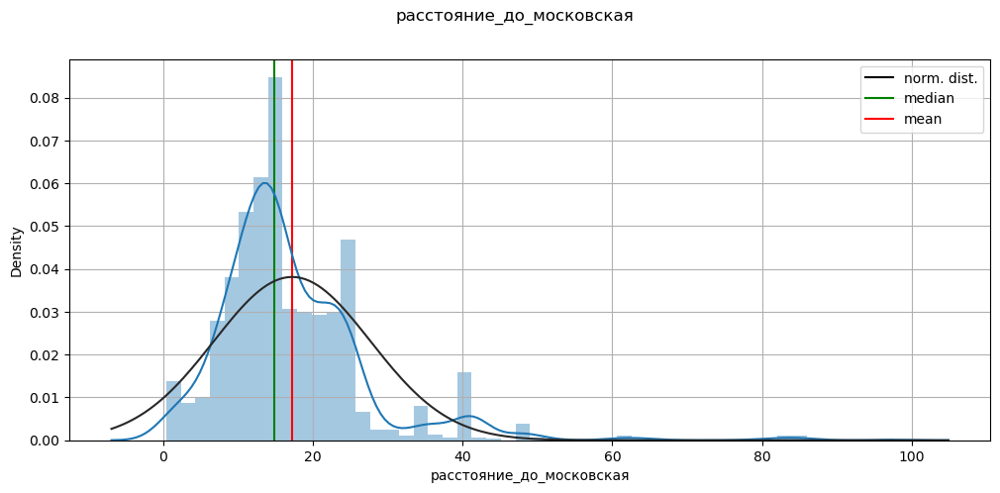

Ассиметрия: 10.809657231560687
Аксцесс: 2.419512560040364


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


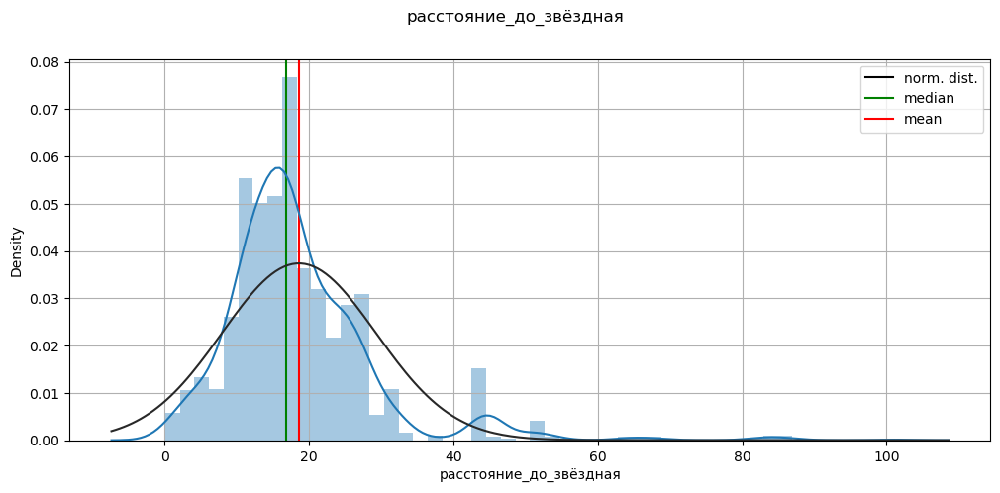

Ассиметрия: 10.558870384122297
Аксцесс: 2.4064031783803945


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


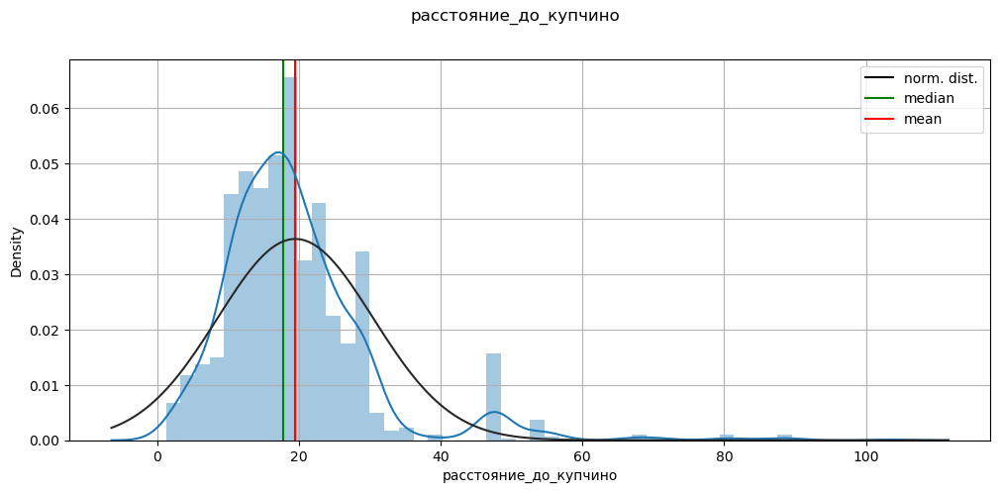

Ассиметрия: 10.056278168195046
Аксцесс: 2.4079504776256875


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


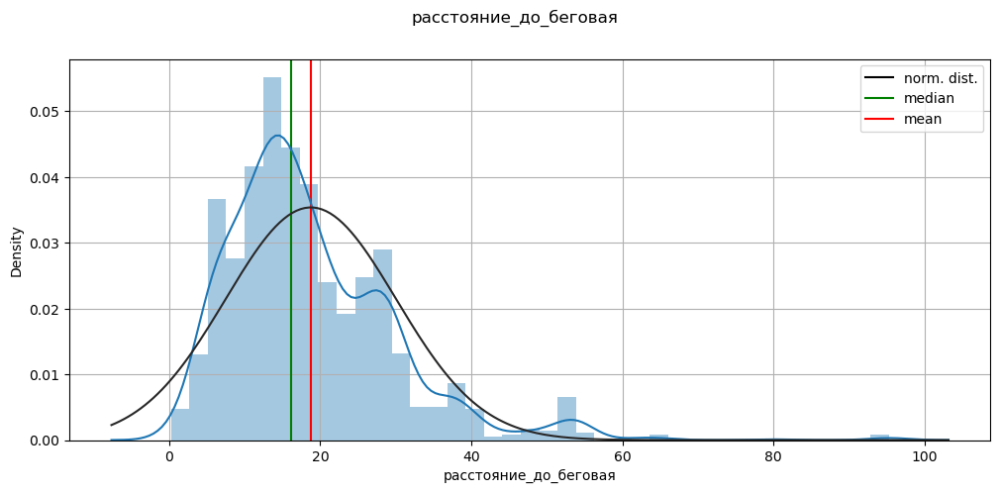

Ассиметрия: 5.667796195290753
Аксцесс: 1.6864656082877127


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


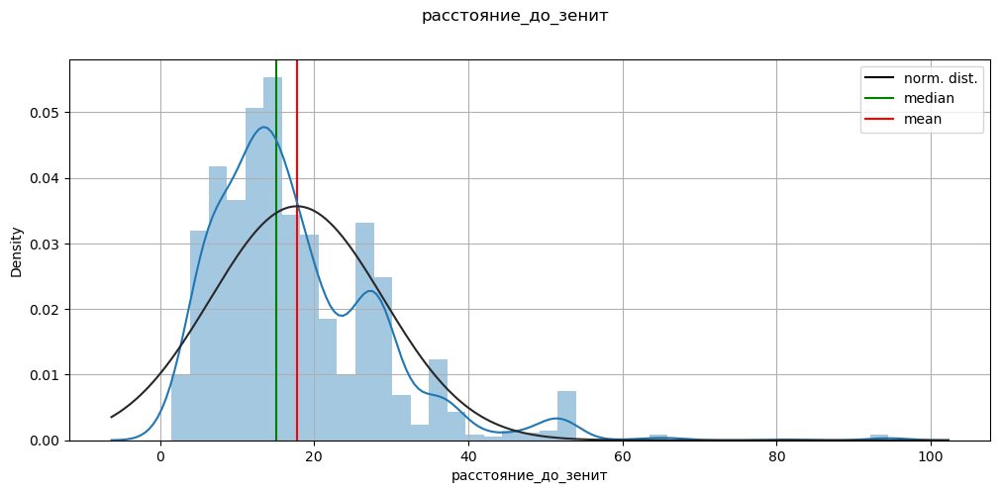

Ассиметрия: 6.081687563911666
Аксцесс: 1.774441204346882


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


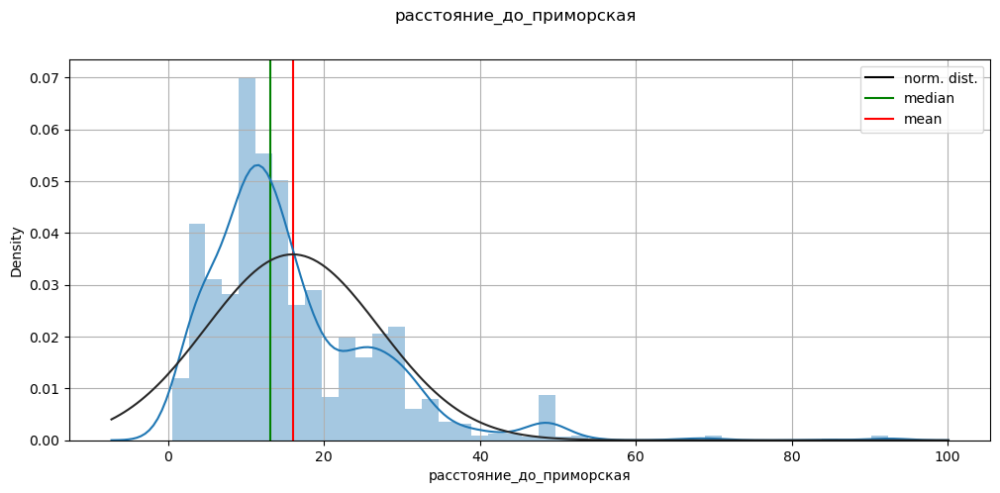

Ассиметрия: 6.769877065463492
Аксцесс: 1.9090795575295287


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


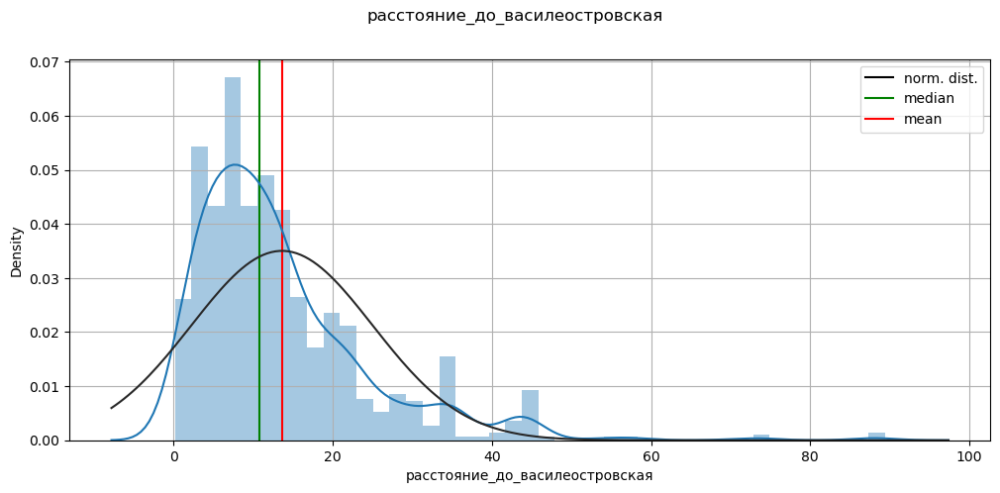

Ассиметрия: 7.207238863230106
Аксцесс: 2.1113234332089377


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


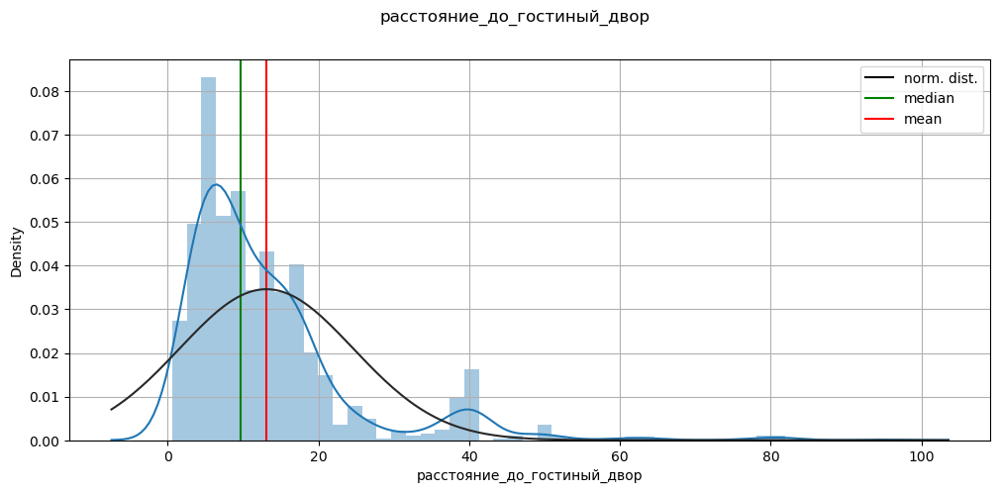

Ассиметрия: 8.616616482864153
Аксцесс: 2.462308119278989


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


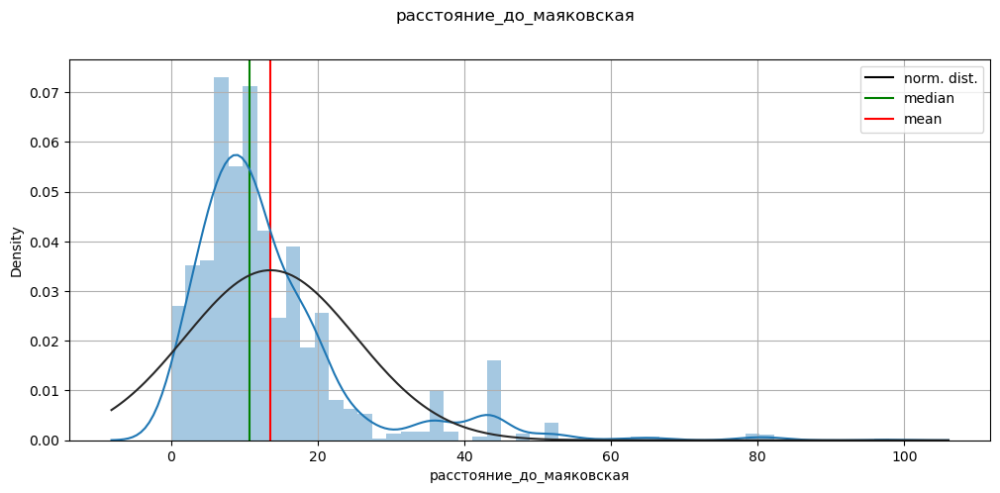

Ассиметрия: 8.772990097996564
Аксцесс: 2.496176883237732


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


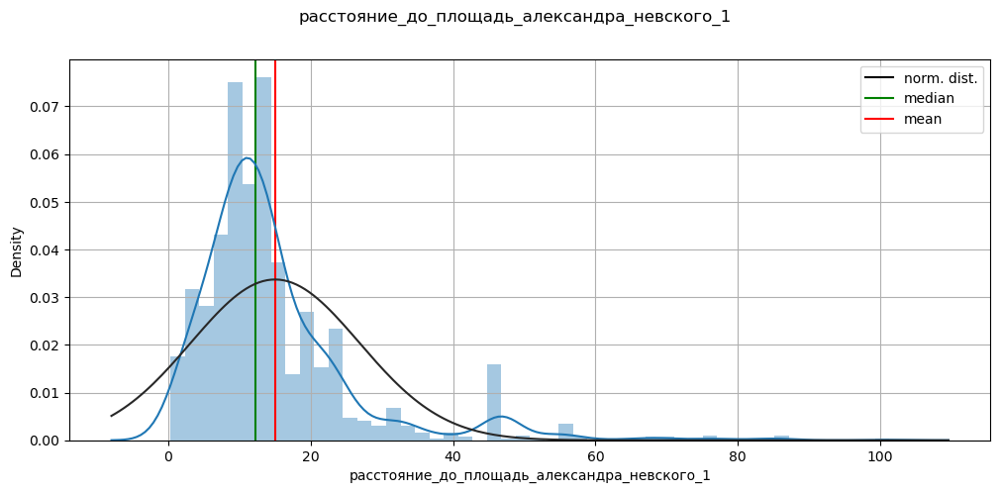

Ассиметрия: 8.912980583303018
Аксцесс: 2.5246951051612623


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


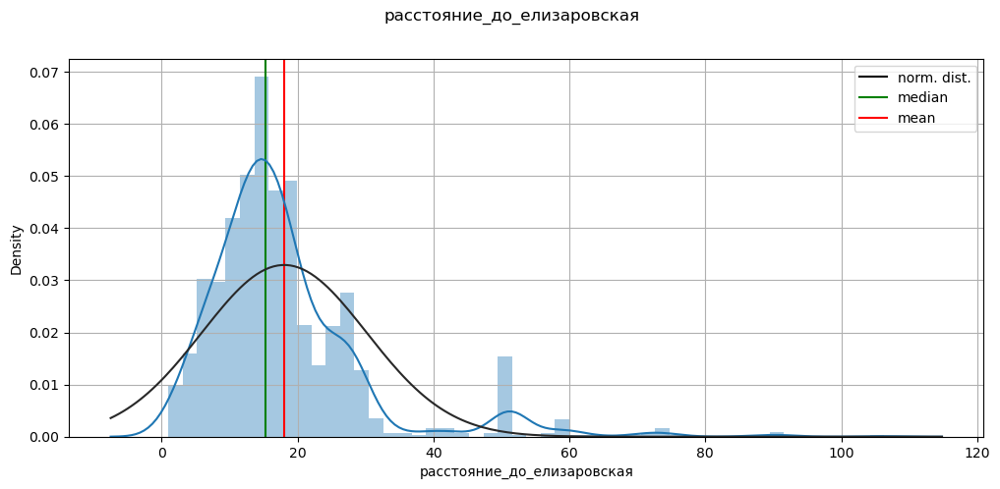

Ассиметрия: 8.535691664930653
Аксцесс: 2.402703959179336


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


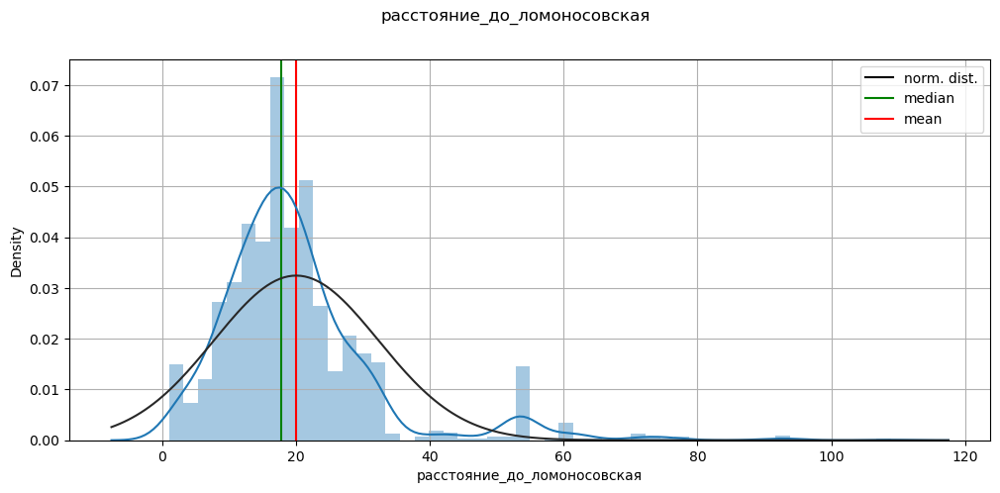

Ассиметрия: 8.051611134472934
Аксцесс: 2.2644602864181316


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


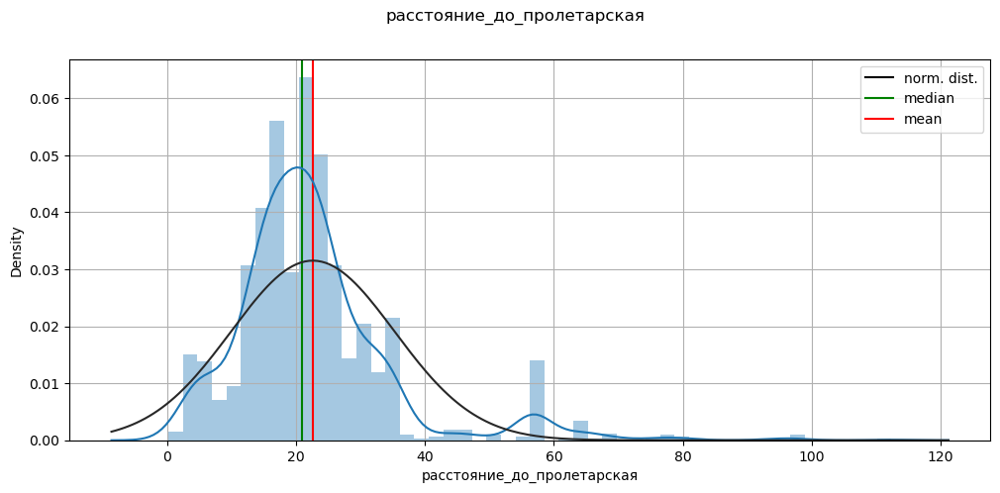

Ассиметрия: 7.235303975925037
Аксцесс: 2.0697391776621847


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


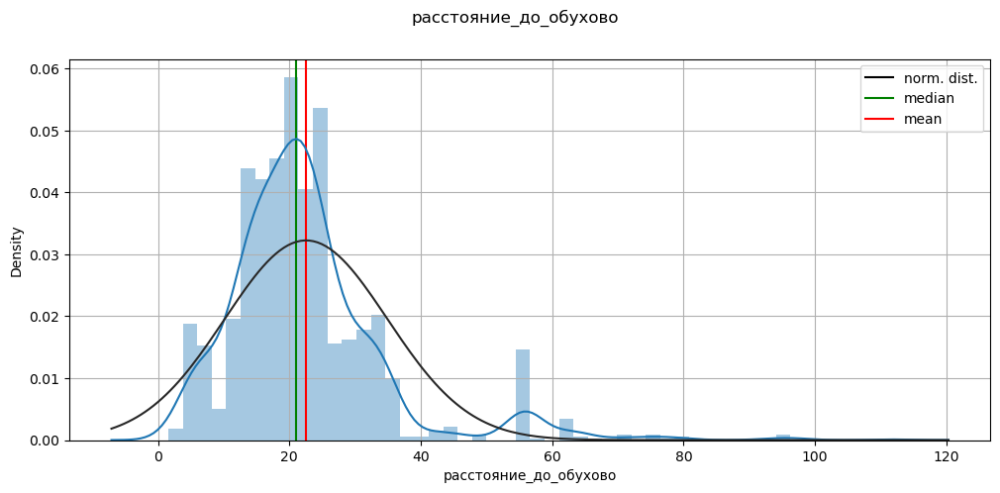

Ассиметрия: 7.602339962649506
Аксцесс: 2.127924007679792


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


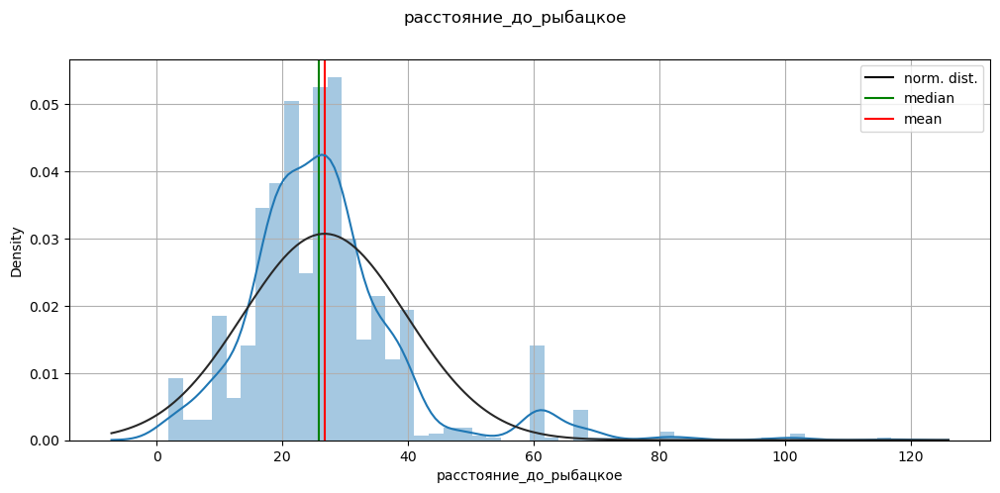

Ассиметрия: 6.34940447781984
Аксцесс: 1.798787472514803


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


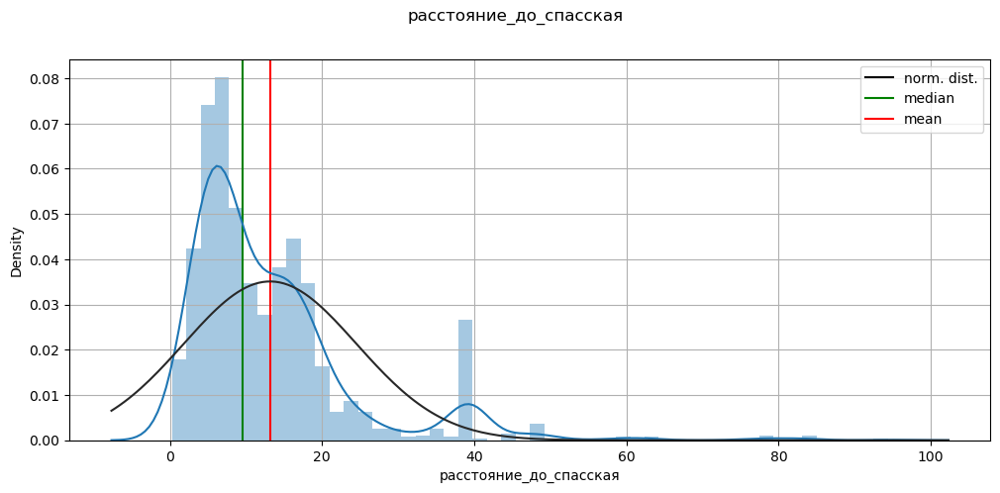

Ассиметрия: 8.68034072763055
Аксцесс: 2.429125902657538


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


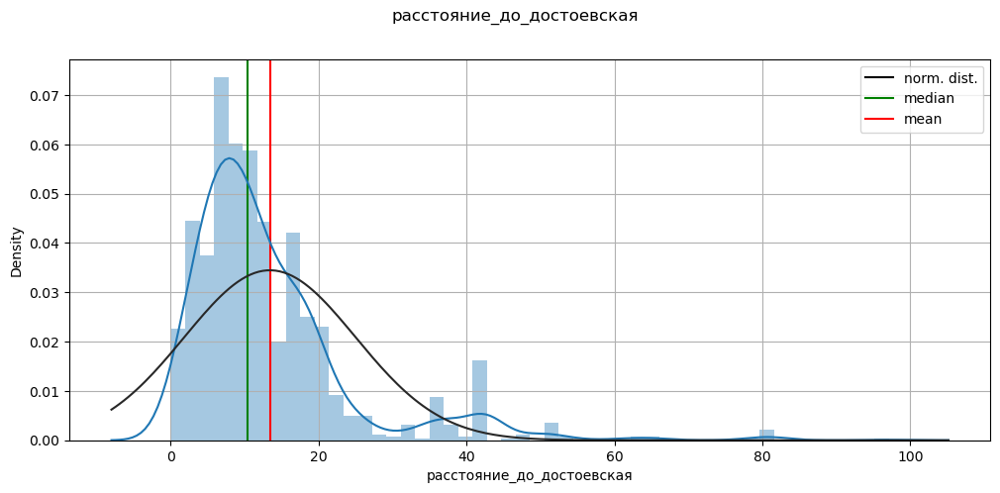

Ассиметрия: 8.846793197549752
Аксцесс: 2.4932690808927607


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


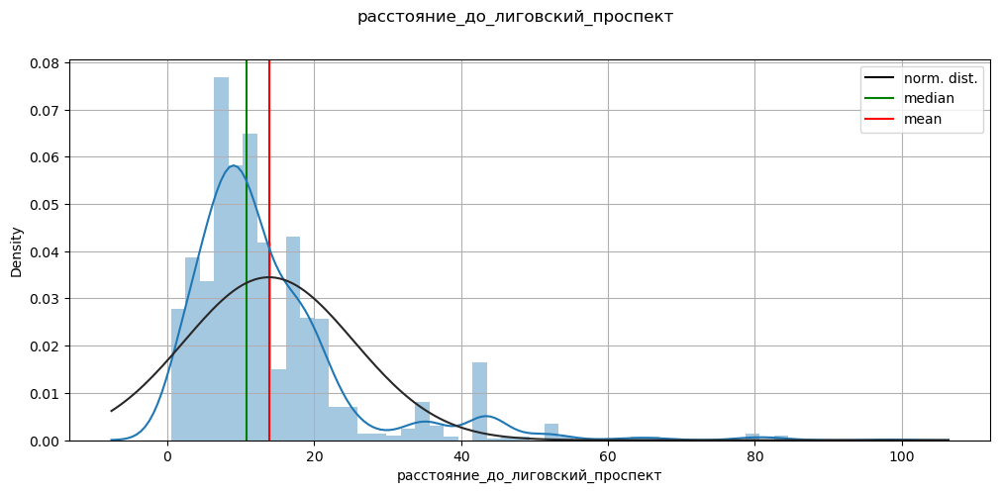

Ассиметрия: 9.087964251741825
Аксцесс: 2.519767288033113


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


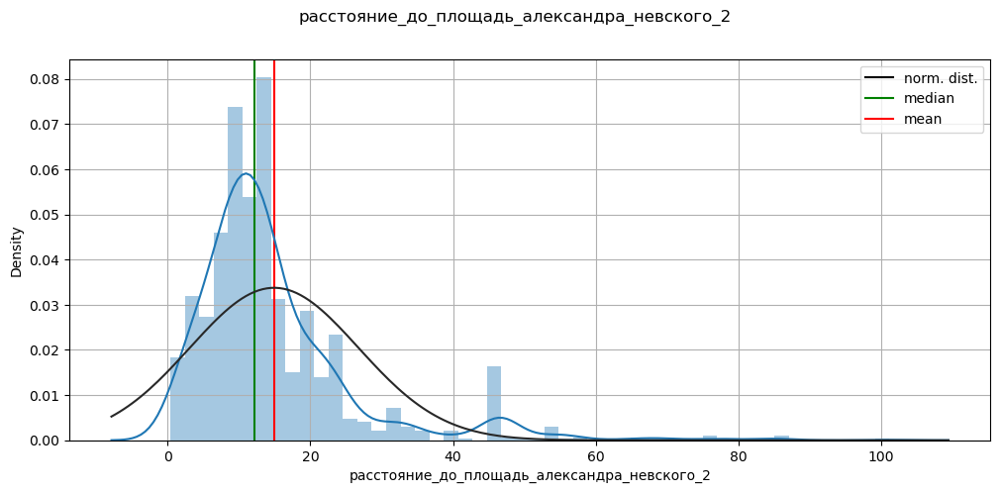

Ассиметрия: 8.943055468219871
Аксцесс: 2.527041113341849


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


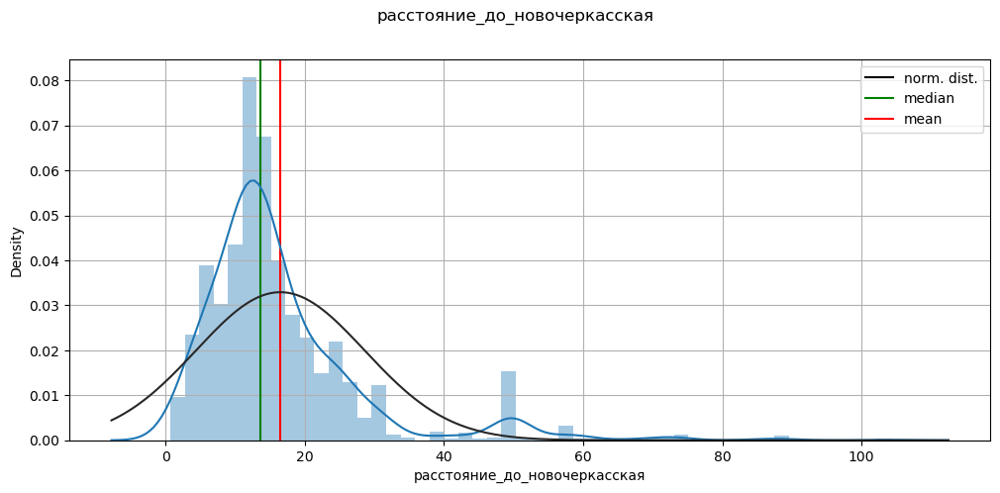

Ассиметрия: 8.47293424740677
Аксцесс: 2.4631243949832884


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


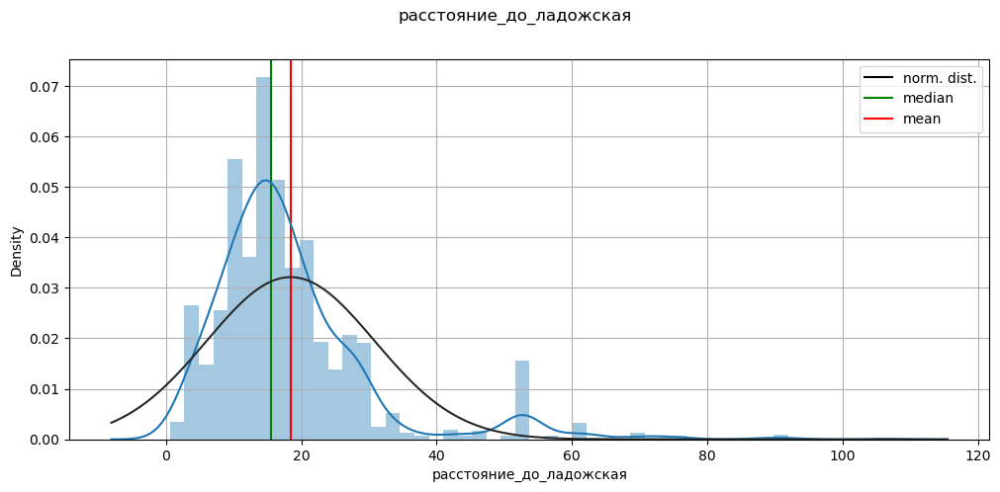

Ассиметрия: 7.881130906138251
Аксцесс: 2.345980470768979


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


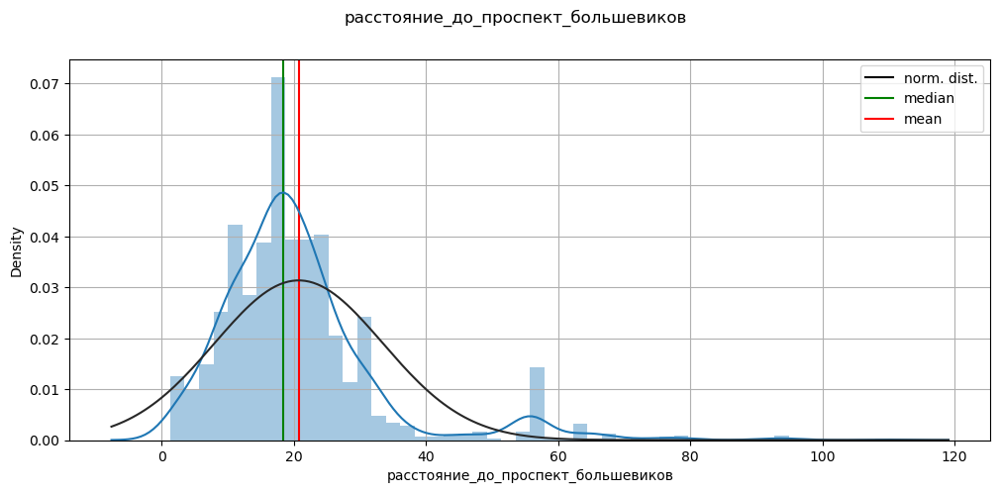

Ассиметрия: 7.328510251394292
Аксцесс: 2.188513429105183


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


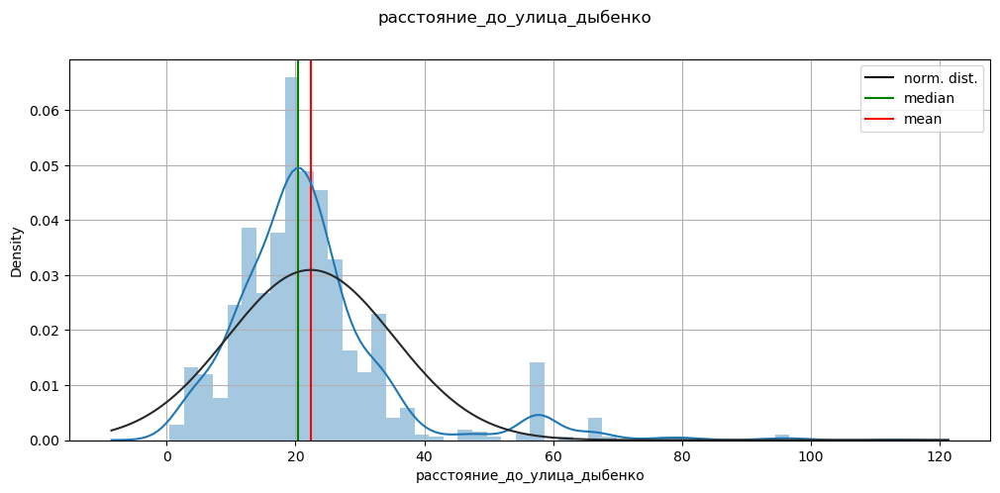

Ассиметрия: 7.003417515753068
Аксцесс: 2.088019624652765


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


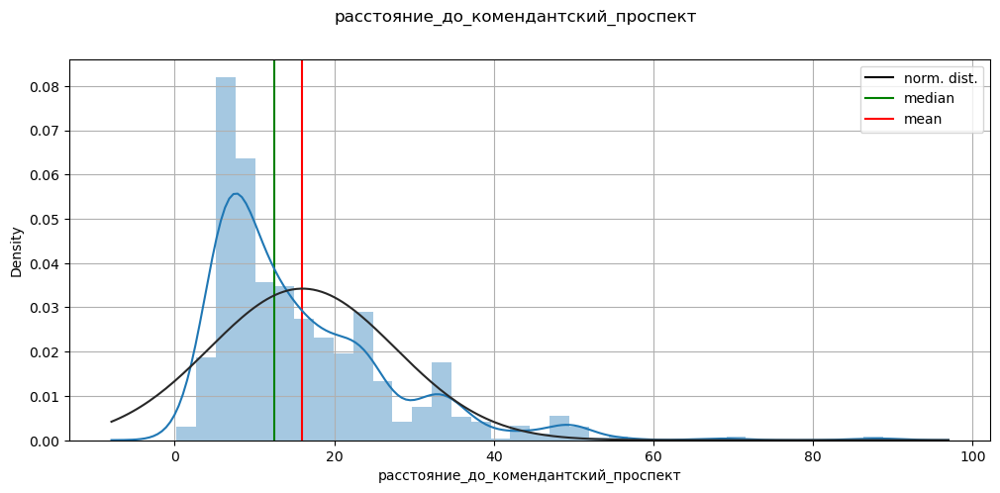

Ассиметрия: 5.132129560415672
Аксцесс: 1.8233452996652466


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


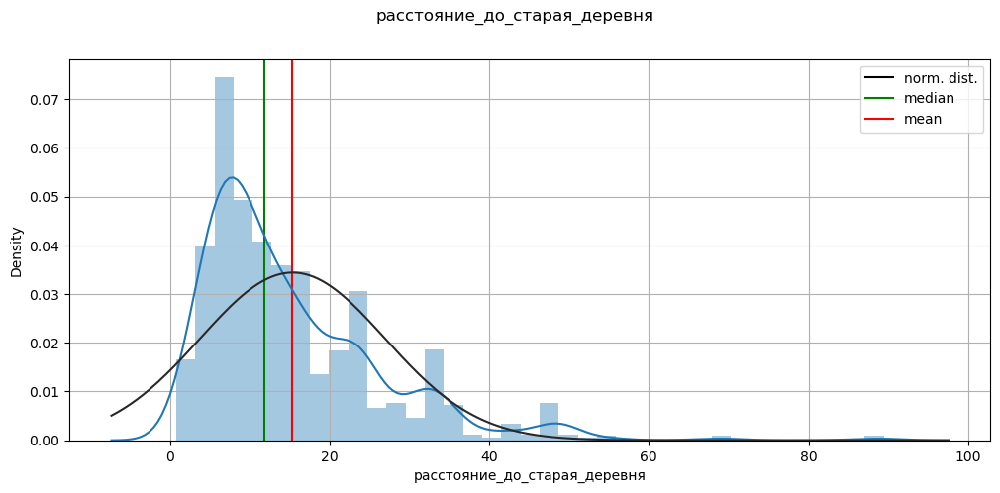

Ассиметрия: 5.567212659432046
Аксцесс: 1.8669000304515606


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


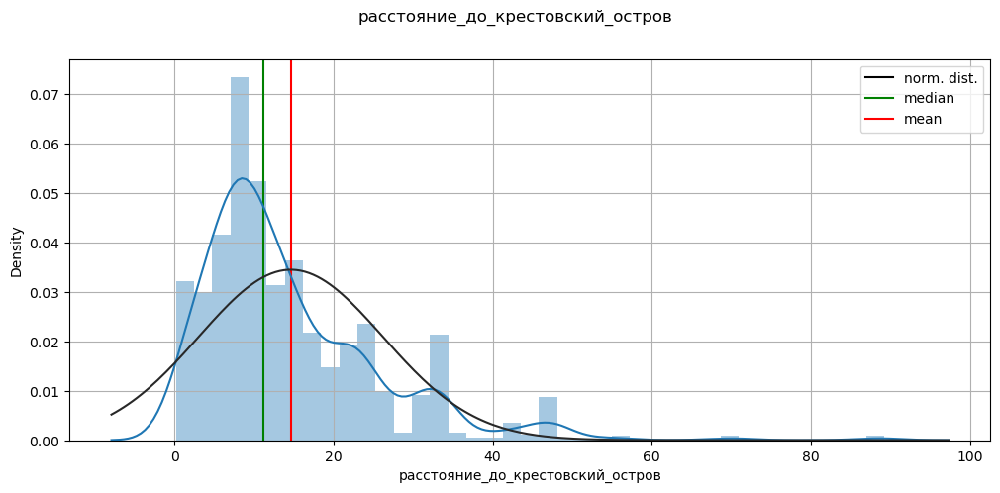

Ассиметрия: 5.9577568836035155
Аксцесс: 1.9037091833794597


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


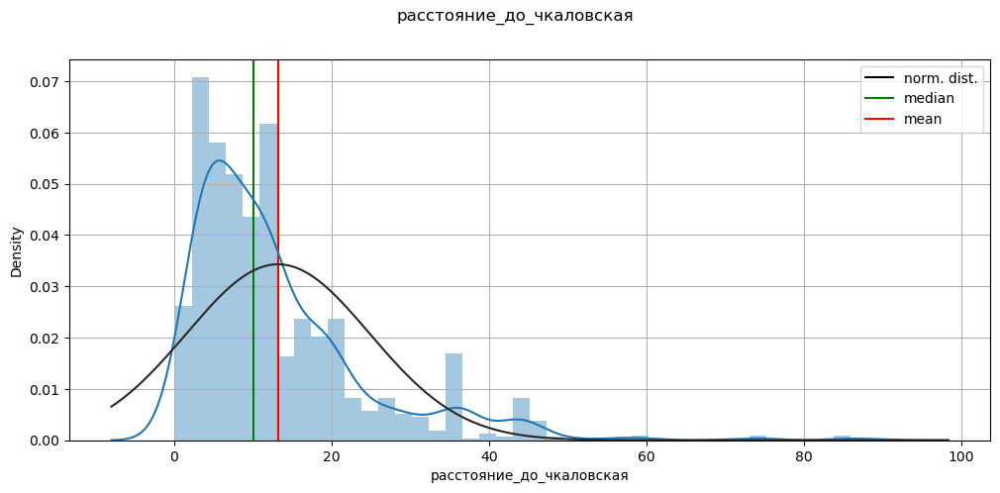

Ассиметрия: 6.832659098230199
Аксцесс: 2.144757405747927


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


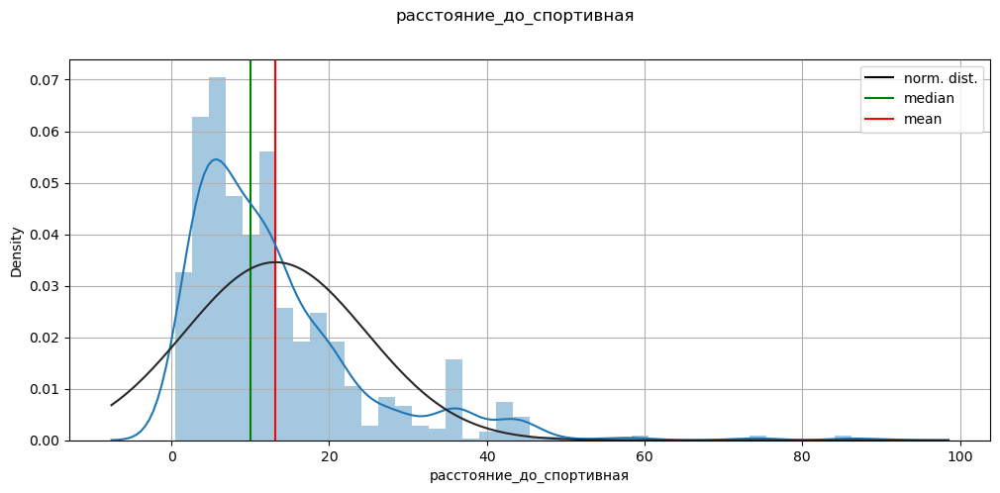

Ассиметрия: 7.140688114986146
Аксцесс: 2.1736638914626343


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


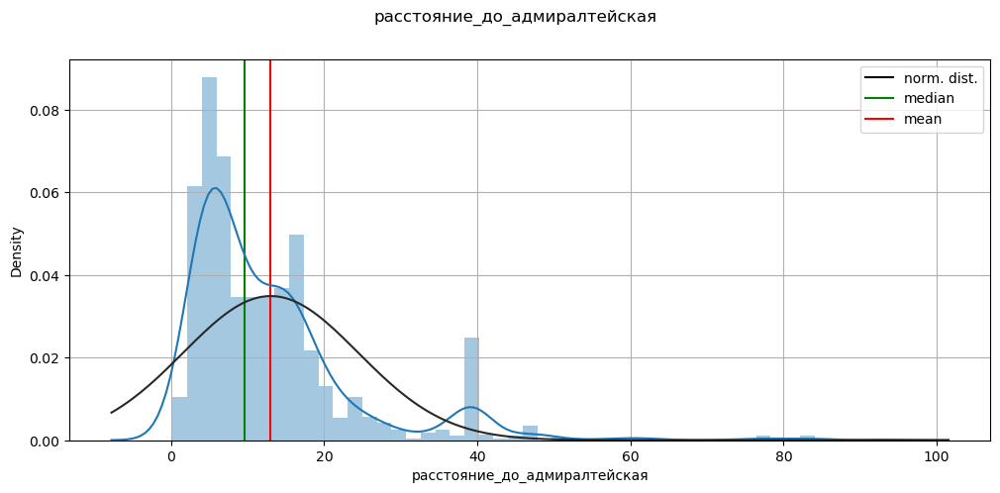

Ассиметрия: 8.299316566471596
Аксцесс: 2.3866838729067505


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


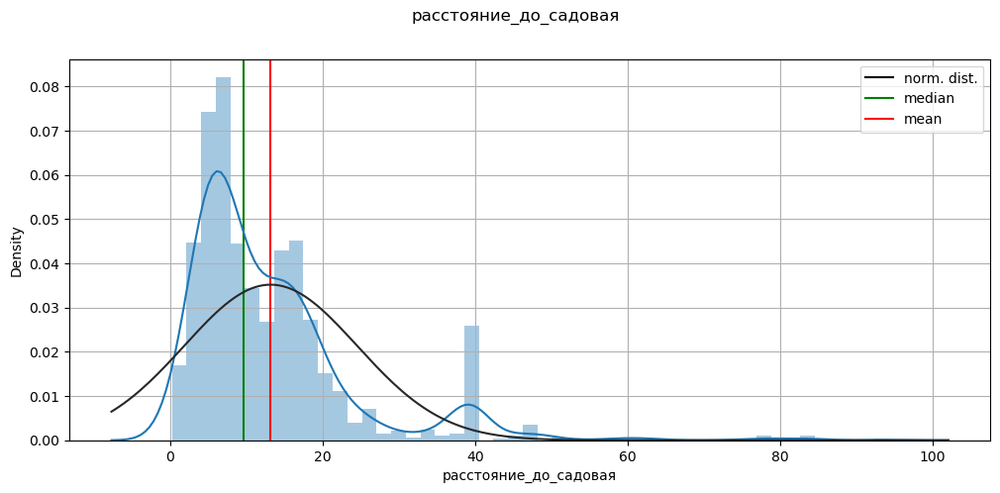

Ассиметрия: 8.657015277728311
Аксцесс: 2.418763017946446


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


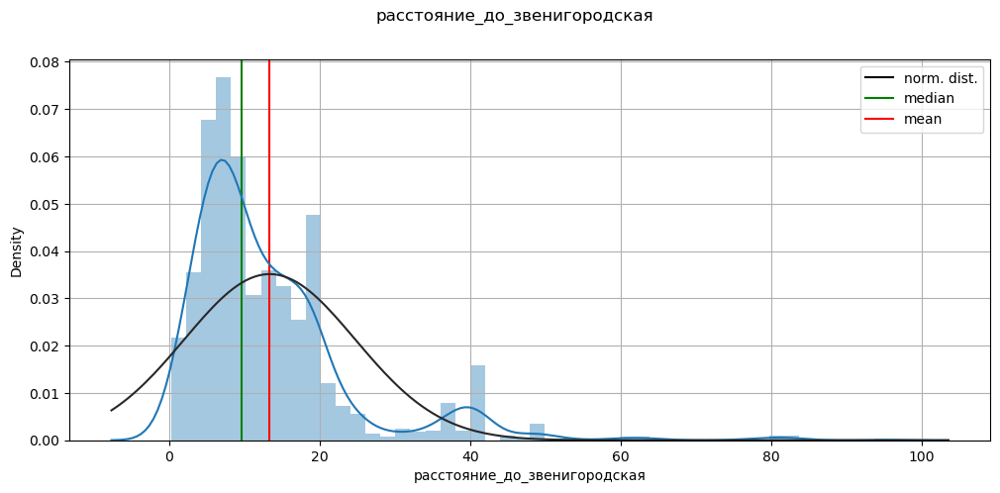

Ассиметрия: 9.008634712373654
Аксцесс: 2.4764797882783096


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


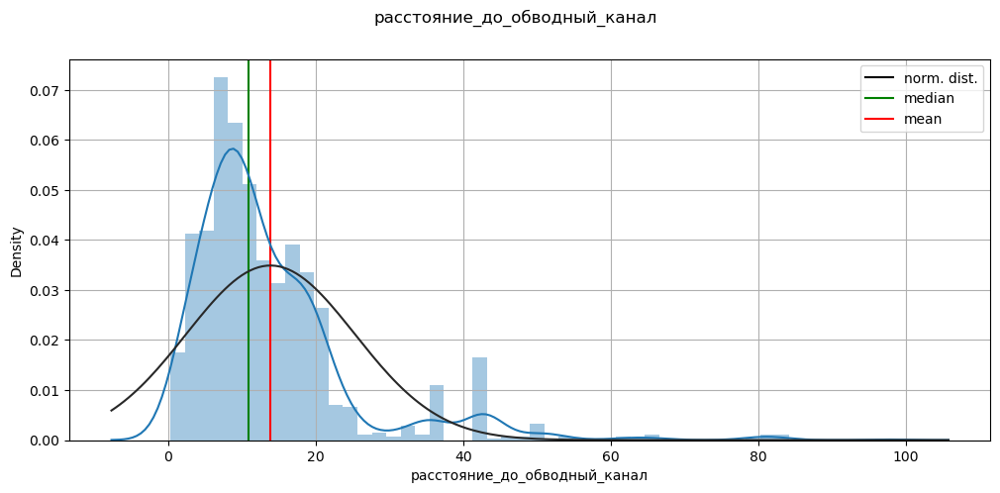

Ассиметрия: 9.284692168461962
Аксцесс: 2.527612569253202


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


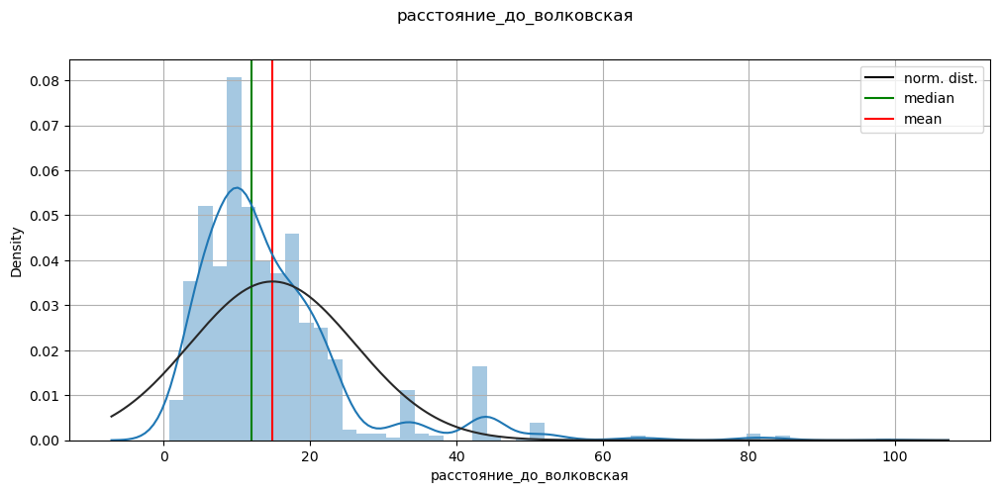

Ассиметрия: 9.822945217790673
Аксцесс: 2.573416038780852


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


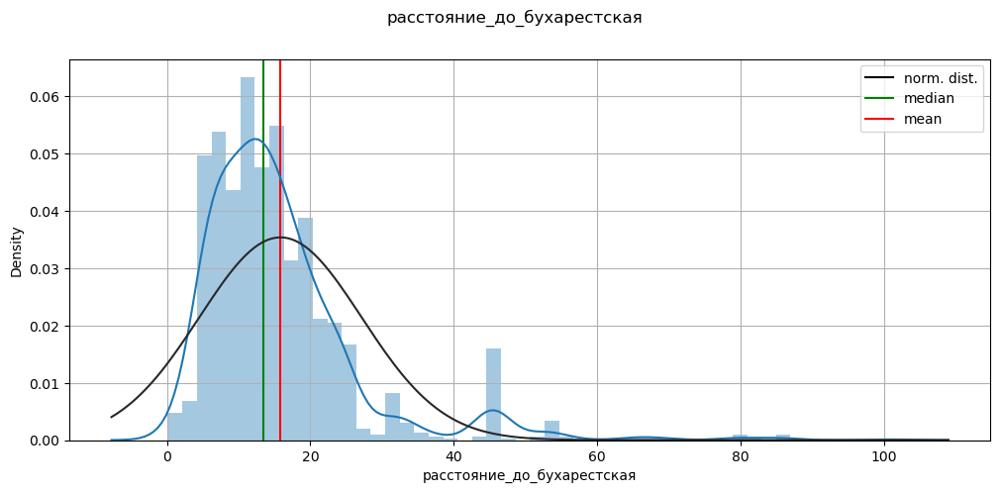

Ассиметрия: 9.983697117344272
Аксцесс: 2.5821038935989824


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


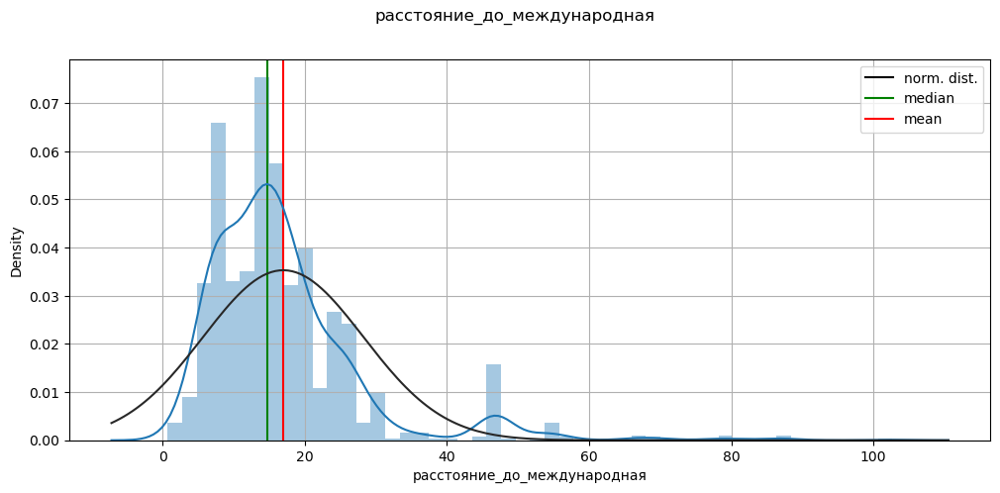

Ассиметрия: 9.982596855106378
Аксцесс: 2.558551291551249


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


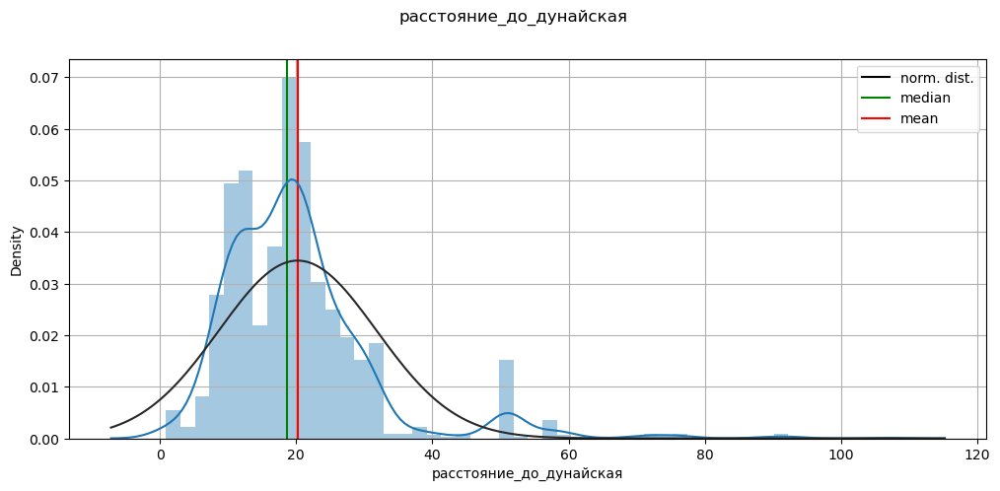

Ассиметрия: 9.090746686136708
Аксцесс: 2.356000437611546


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


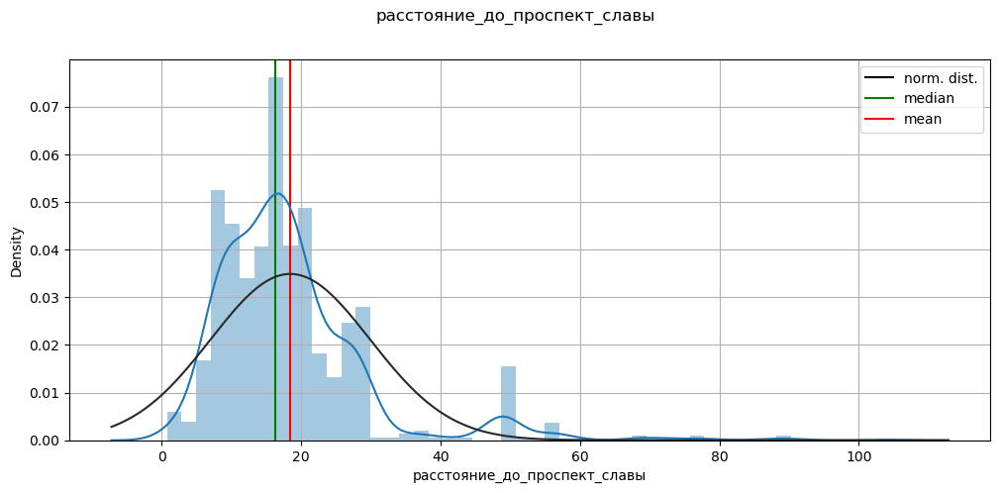

Ассиметрия: 9.60843537995186
Аксцесс: 2.4770411114133477


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


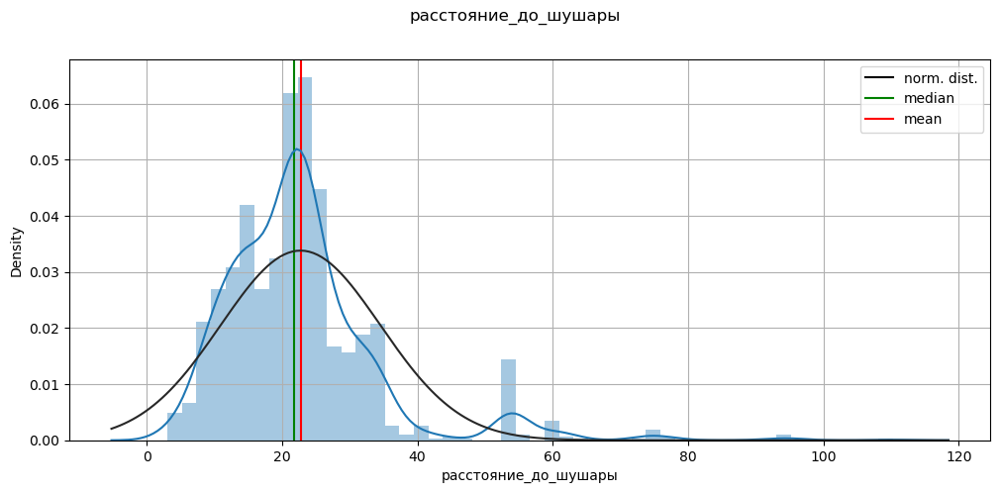

Ассиметрия: 8.314922003229382
Аксцесс: 2.1987578021565204


E:\anaconda\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


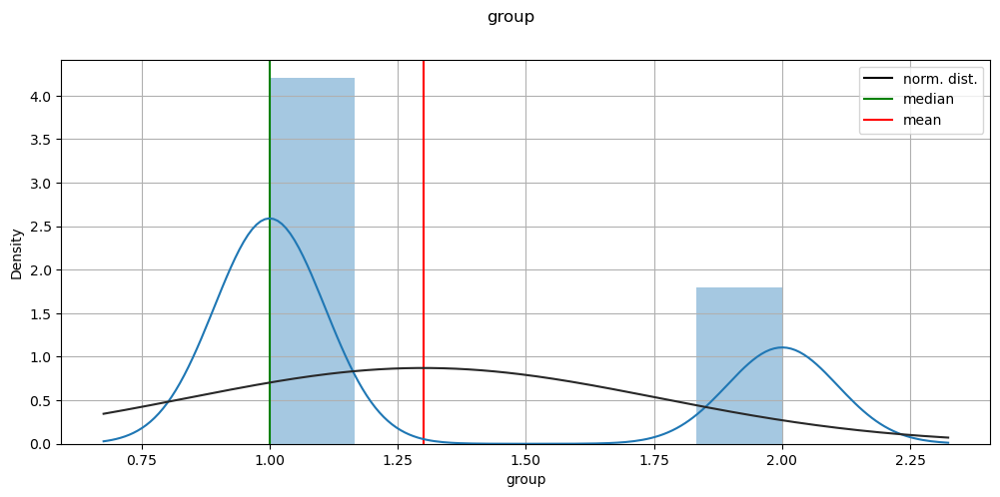

Ассиметрия: -1.2336011632057586
Аксцесс: 0.8764645274578905


In [19]:
num_visualization(df, num_features)

# Даня, обрати внимание на лог распределение цены, на общей картине графиков, показывает себя не плохо.

In [20]:
def cat_visualization(df, cat_features):
    
    """ 
    
    Строит countplot (seaborn) для всех категриальных признаков, 
    для train и test выборки.
    
    """

    # Количество признаков
    num_of_features = len(cat_features)

    for cat in cat_features:
        
        print(cat.upper()+'\n')
        
        for i in range(df[cat].nunique()):
            print('{}: {} / {}%'.format(df[cat].unique()[i],
                                        df[cat][df[cat] == df[cat].unique()[i]].count(),
                                        round((df[cat][df[cat] == df[cat].unique()[i]].count()*100)/df.shape[0], 2)))

        fig = plt.figure(figsize=(16, 8))
        
        if df[cat].nunique() > 10:
            plt.tick_params(axis='x', rotation=90)
            
        plt.grid(axis='both')
        sns.countplot(df[cat], order=df[cat].value_counts().index)
        
        plt.show()

BALCONY

балкон: 384 / 26.36%
nan: 0 / 0.0%
лоджия: 477 / 32.74%


E:\anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


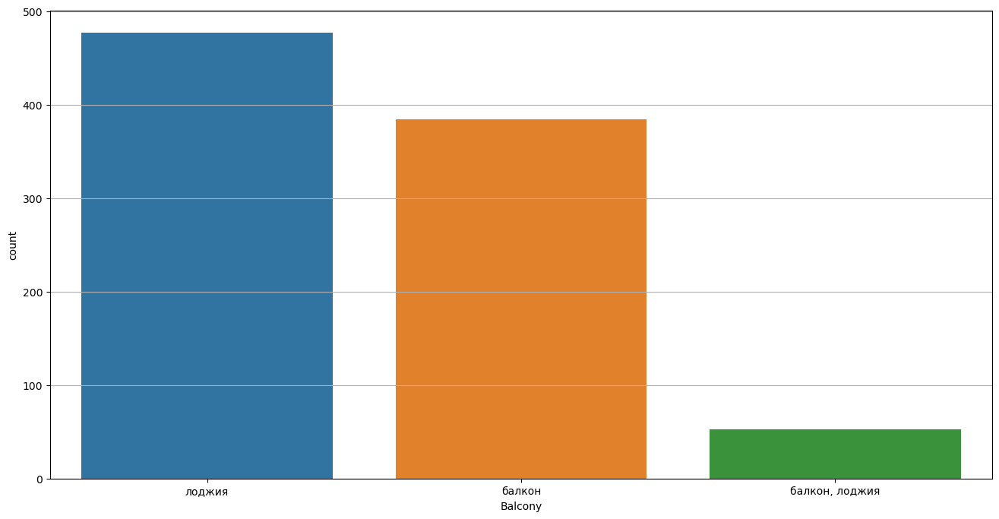

BATHROOM

раздельный: 559 / 38.37%
совмещенный: 379 / 26.01%
nan: 0 / 0.0%


E:\anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


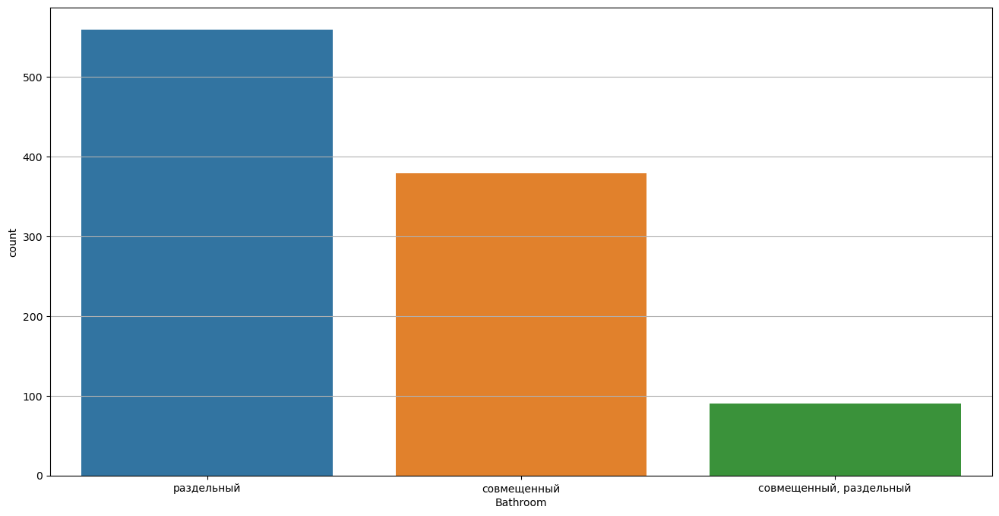

E:\anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


WINDOWS

во двор, на улицу, на солнечную сторону: 108 / 7.41%
во двор, на солнечную сторону: 24 / 1.65%
на улицу: 151 / 10.36%
nan: 0 / 0.0%
во двор, на улицу: 304 / 20.86%
во двор: 169 / 11.6%
на улицу, на солнечную сторону: 24 / 1.65%


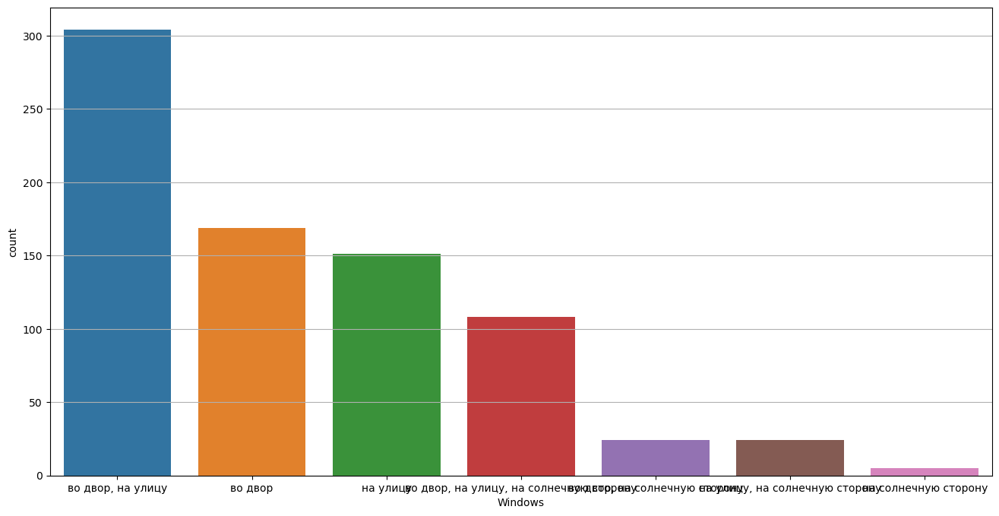

SALE_METHOD



E:\anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


свободная: 715 / 49.07%
альтернативная: 102 / 7.0%
nan: 0 / 0.0%
переуступка: 44 / 3.02%
договор ЖСК: 2 / 0.14%


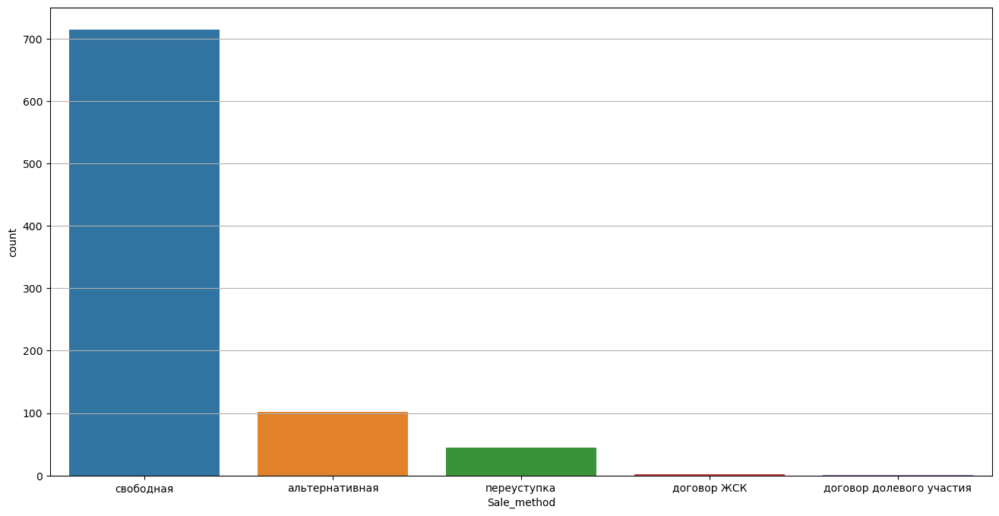

HOUSE_TYPE

кирпичный: 653 / 44.82%
панельный: 86 / 5.9%
монолитный: 597 / 40.97%
монолитно-кирпичный: 116 / 7.96%
блочный: 5 / 0.34%


E:\anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


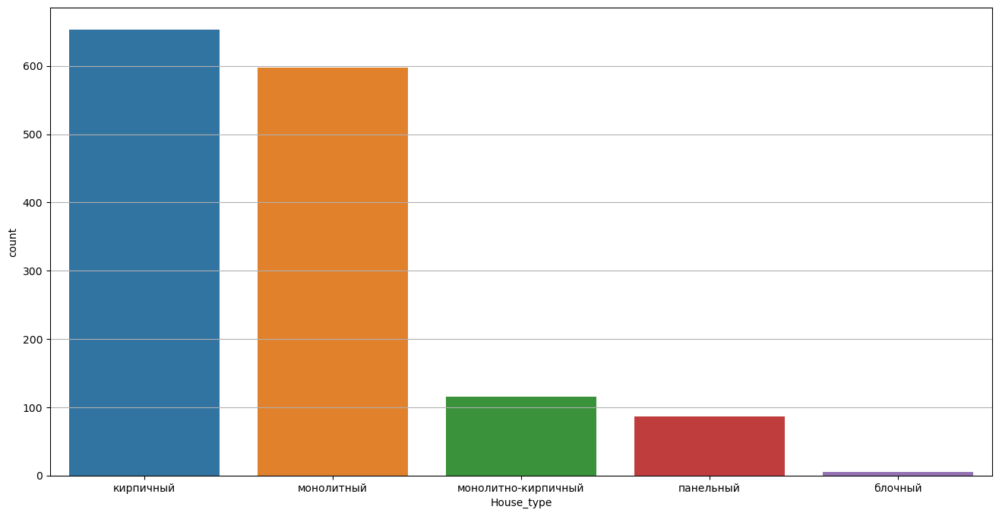

WMO

Шушары: 25 / 1.72%
Литейный округ: 31 / 2.13%
округ Озеро Долгое: 5 / 0.34%
округ Гавань: 12 / 0.82%
округ Звёздное: 24 / 1.65%
округ Волковское: 25 / 1.72%
Южно-Приморский округ: 24 / 1.65%
округ Коломяги: 36 / 2.47%
округ Смольнинское: 45 / 3.09%
Владимирский округ: 26 / 1.78%
округ Московская застава: 32 / 2.2%
округ Ульянка: 2 / 0.14%
округ Красненькая речка: 2 / 0.14%
округ Морской: 10 / 0.69%
округ Сергиевское: 1 / 0.07%
округ Сампсониевское: 41 / 2.81%
Невский округ: 39 / 2.68%
округ Пороховые: 7 / 0.48%
округ Пискарёвка: 5 / 0.34%
округ № 65: 21 / 1.44%
округ Светлановское: 50 / 3.43%
округ Ланское: 57 / 3.91%
округ Малая Охта: 18 / 1.24%
Народный округ: 17 / 1.17%
округ № 15: 24 / 1.65%
округ Правобережный: 3 / 0.21%
округ Комендантский аэродром: 16 / 1.1%
округ Семёновский: 14 / 0.96%
Колпино: 31 / 2.13%
округ Гражданка: 3 / 0.21%
округ Аптекарский остров: 28 / 1.92%
Финляндский округ: 13 / 0.89%
Парголово: 33 / 2.26%
округ Сосновая поляна: 4 / 0.27%
округ Пулковский мер

E:\anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


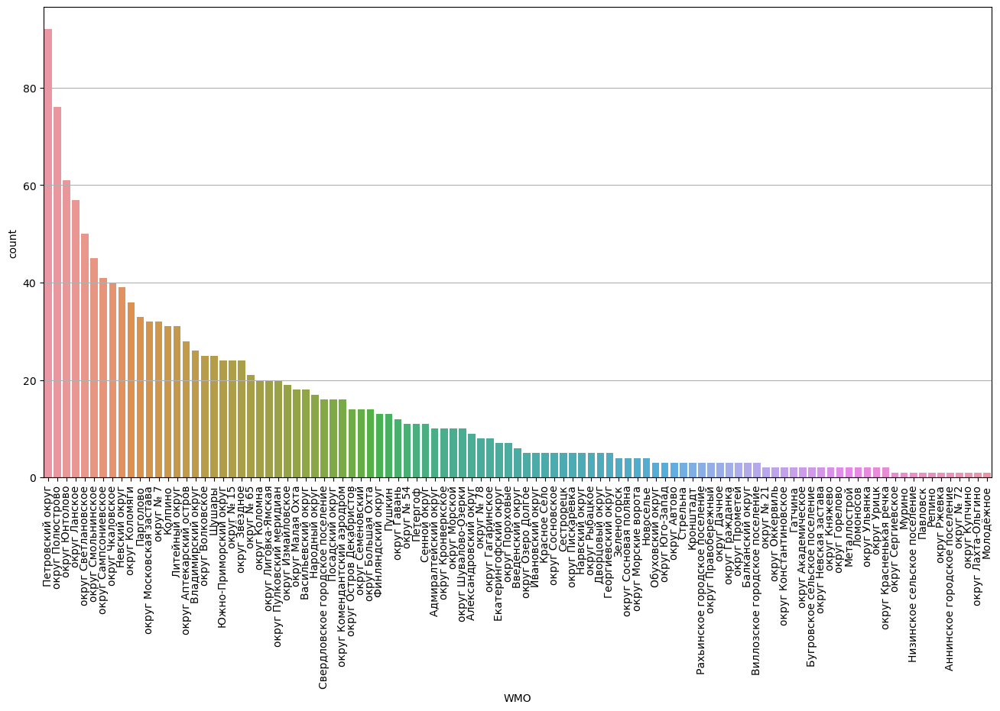

NAME

Пушкинский: 39 / 2.68%
Центральный: 135 / 9.27%
Приморский: 197 / 13.52%
Василеостровский: 86 / 5.9%
Московский: 84 / 5.77%
Фрунзенский: 44 / 3.02%
Красносельский: 42 / 2.88%
Кировский: 21 / 1.44%
Выборгский: 164 / 11.26%
Невский: 87 / 5.97%
Красногвардейский: 116 / 7.96%
Калининский: 28 / 1.92%
Адмиралтейский: 81 / 5.56%
Колпинский: 33 / 2.26%
Петроградский: 192 / 13.18%
nan: 0 / 0.0%
Курортный: 11 / 0.75%
Петродворцовый: 16 / 1.1%


E:\anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


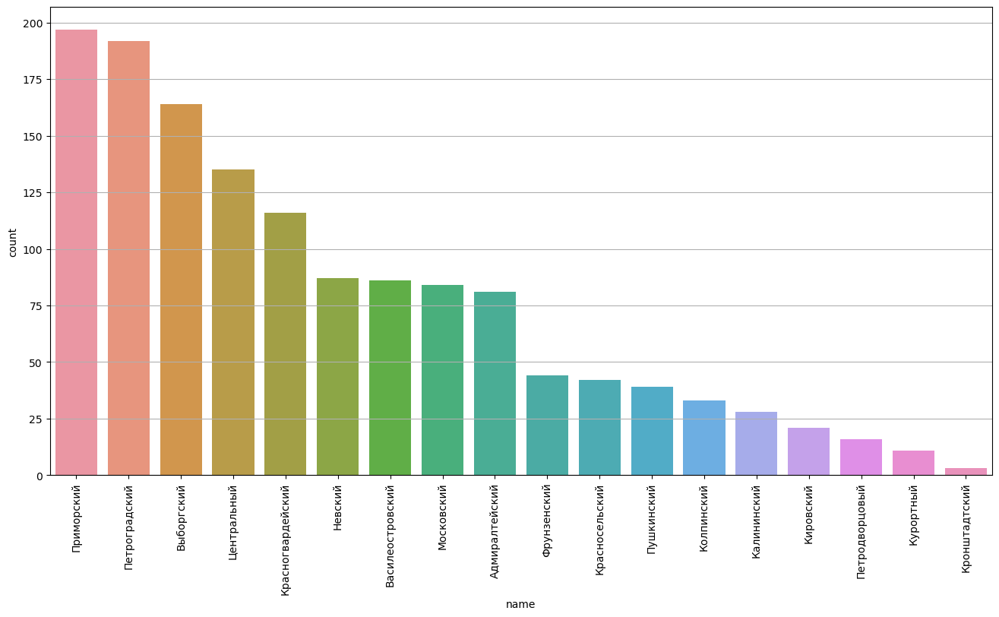

SUBWAY_STATION

no_info: 178 / 12.22%
Гостиный двор: 3 / 0.21%
Комендантский проспект: 73 / 5.01%
Приморская: 80 / 5.49%
Звёздная: 22 / 1.51%
Международная: 4 / 0.27%
Чернышевская: 40 / 2.75%
Проспект Ветеранов: 14 / 0.96%
Владимирская: 3 / 0.21%
Электросила: 8 / 0.55%
Автово: 5 / 0.34%
Удельная: 25 / 1.72%
Проспект Просвещения: 44 / 3.02%
Лесная: 80 / 5.49%
Проспект Большевиков: 9 / 0.62%
Ладожская: 10 / 0.69%
Площадь Александра Невского 1: 8 / 0.55%
Площадь Мужества: 13 / 0.89%
Беговая: 18 / 1.24%
Новочеркасская: 25 / 1.72%
Обухово: 17 / 1.17%
Пионерская: 19 / 1.3%
Технологический институт 2: 8 / 0.55%
Академическая: 28 / 1.92%
Петроградская: 43 / 2.95%
Московская: 31 / 2.13%
Площадь Александра Невского 2: 13 / 0.89%
Парнас: 32 / 2.2%
Озерки: 27 / 1.85%
Волковская: 8 / 0.55%
Нарвская: 12 / 0.82%
Крестовский остров: 75 / 5.15%
Чкаловская: 51 / 3.5%
Дунайская: 14 / 0.96%
Улица Дыбенко: 32 / 2.2%
Девяткино: 2 / 0.14%
Гражданский проспект: 33 / 2.26%
Невский проспект: 5 / 0.34%
Рыбацкое:

E:\anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


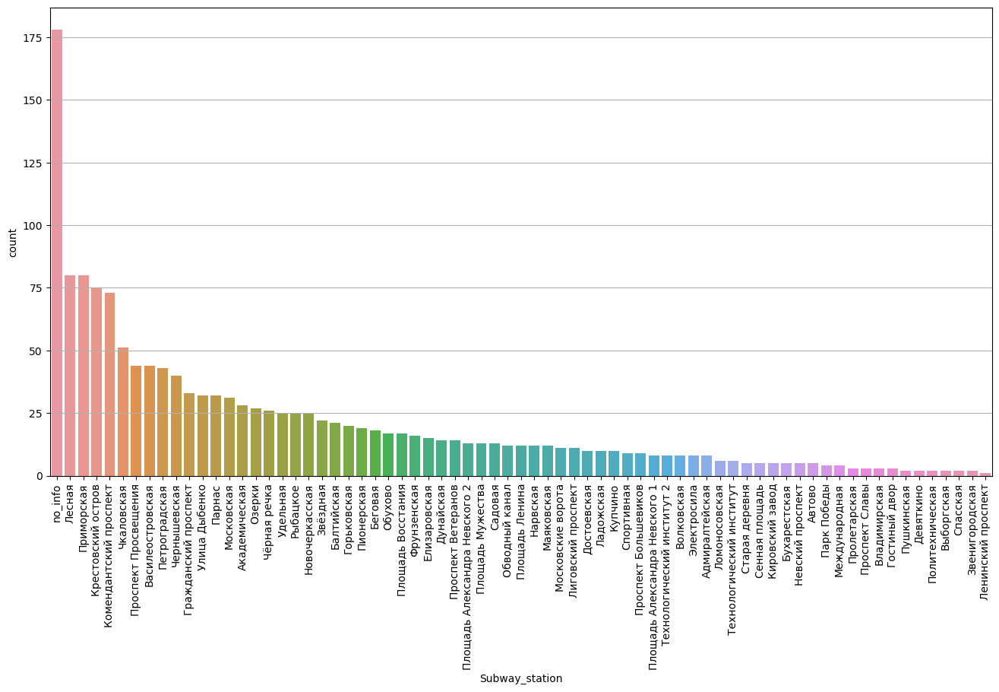

TIME_FOR_SUBWAY

no_info: 260 / 17.84%
15: 255 / 17.5%
10: 258 / 17.71%
31: 326 / 22.37%
20: 171 / 11.74%
30: 187 / 12.83%


E:\anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


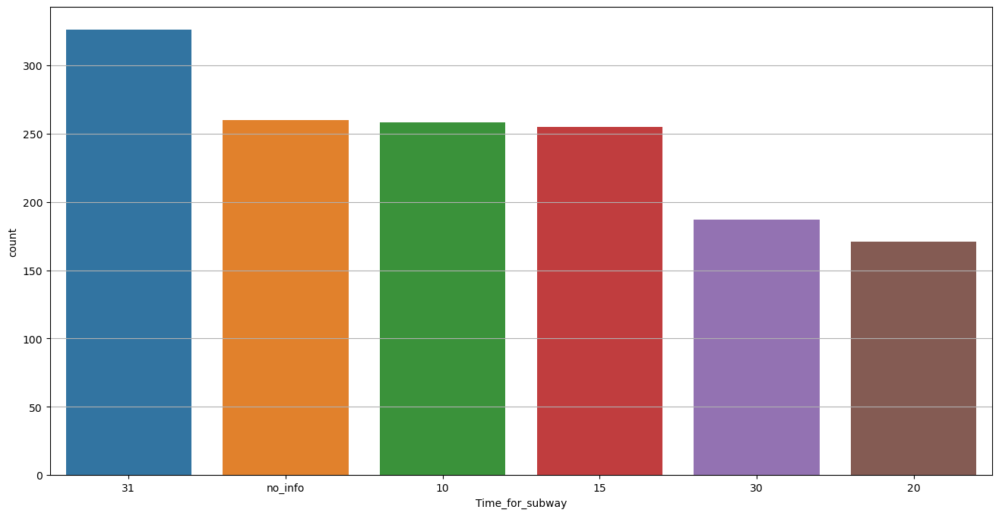

In [21]:
cat_visualization(df, cat_features)

Нужно будет поработать с категориальными фичами, видно, что разница между балконами и лоджи при продаже квартир не существенная. 
С фичей Windows нужно будет поработать, полагаю есть всего 3 стороны: во двор, на улицу и и во двор и на улицу.

In [22]:
df.to_csv('last_df.csv', index=False)